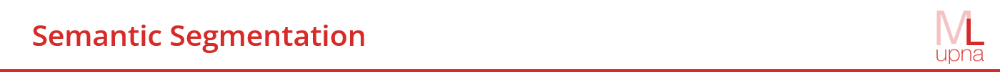

In this exercise, you will learn the fundamentals of <span style="color:#D52B29">semantic segmentation</span>, a core task in computer vision where the goal is to assign a <span style="color:#D52B29">class label</span> to each pixel of an image. Unlike classification, which predicts a single label for an entire image, or detection, which localizes objects with bounding boxes, semantic segmentation provides a much more detailed and structured understanding of visual content.

We will use the <span style="color:#D52B29">Clothing Co-Parsing (CCP)</span> dataset, which contains images of people annotated with pixel-level labels for different clothing categories. To simplify the problem and illustrate the task of segmentation, we will reduce the dataset into a <span style="color:#D52B29">binary problem</span> with only two classes: <span style="color:#D52B29">person</span> / <span style="color:#D52B29">background</span>.

![CCP Dataset](https://raw.githubusercontent.com/bearpaw/clothing-co-parsing/master/example.jpg)

Throughout the notebook, you will explore different approaches to segmentation:

- <span style="color:#D52B29">Sliding window</span> classification of the central pixel.

- <span style="color:#D52B29">Fully convolutional networks (FCNs)</span>.

- The <span style="color:#D52B29">U-Net</span> encoder-decoder architecture.

By the end of this practice, you will understand both the limitations of early approaches and the advantages of modern architectures in semantic segmentation.

## <span style="color:#D52B29">Sliding Window</span>

One of the earliest strategies for <span style="color:#D52B29">semantic segmentation</span> is the <span style="color:#D52B29">sliding window approach</span>. In this method, a fixed-size window is moved across the image, and a classifier predicts the <span style="color:#D52B29">label of the central pixel</span> based on the content inside the window.

While simple to implement, this approach, as we will see in this section, has several drawbacks:

- It is <span style="color:#D52B29">computationally expensive</span> since the network runs on many overlapping patches.

- The model often struggles to capture <span style="color:#D52B29">global context</span> because predictions are based only on local neighborhoods.

Despite these limitations, the sliding window method provides an intuitive first step toward understanding pixel-level classification.

In [1]:
# # Download from Huggingface
# !wget -q --show-progress https://huggingface.co/datasets/cayala/CCP/resolve/main/clothes.zip

# # Extract to folder
# !unzip -q clothes.zip

# # Remove the zip file
# !rm clothes.zip

In [3]:
# Buid dataset from folder structure

from glob import glob
import pandas as pd

images = glob('./clothes/*/images/*')
df = pd.DataFrame(images, columns=['image_path'])
df['mask_path'] = df.image_path.apply(lambda x : x.replace('/images/', '/labels/').replace('.jpg', '.png'))
df['set'] = df.image_path.apply(lambda x : x.split('/')[2])
df.head()

,image_path,mask_path,set
0,./clothes/test/images/0851.jpg,./clothes/test/labels/0851.png,test
1,./clothes/test/images/0852.jpg,./clothes/test/labels/0852.png,test
2,./clothes/test/images/0853.jpg,./clothes/test/labels/0853.png,test
3,./clothes/test/images/0854.jpg,./clothes/test/labels/0854.png,test
4,./clothes/test/images/0855.jpg,./clothes/test/labels/0855.png,test


In [4]:
import pandas as pd

classes = pd.read_csv("clothes/class_dict.csv")

print(classes)

     class_name    r    g    b
0           NaN   69    6   90
1   accessories   70   12   95
2           bag   71   18  101
3          belt   72   25  107
4        blazer   72   30  112
5        blouse   72   35  116
6      bodysuit   71   40  120
7         boots   70   47  124
8           bra   69   52  127
9      bracelet   68   57  130
10         cape   66   61  132
11     cardigan   64   67  135
12        clogs   62   72  136
13         coat   61   76  137
14        dress   58   82  139
15     earrings   56   86  139
16        flats   54   90  140
17      glasses   52   94  141
18       gloves   50   99  141
19         hair   48  103  141
20          hat   46  107  142
21        heels   45  111  142
22       hoodie   43  116  142
23     intimate   41  120  142
24       jacket   40  123  142
25        jeans   38  127  142
26       jumper   36  132  141
27     leggings   35  136  141
28      loafers   34  139  141
29     necklace   32  144  140
30      panties   31  148  139
31      

In [5]:
# import pandas as pd
# import io

# # Load your data
# # (Assuming 'classes' is already loaded as your DataFrame)
# # For example: classes = pd.read_csv("clothes/class_dict.csv")

# # 1. Standard One-Hot Encoding
# # This converts 'class_name' into multiple binary columns (0 or 1).
# # By default, this ignores the 'NaN' value in the first row (row 0 will be all zeros for class columns).
# encoded_classes = pd.get_dummies(classes, columns=['class_name'])

# # 2. Include NaN as a category (Optional)
# # If you want 'NaN' to have its own column (class_name_nan), set dummy_na=True.
# encoded_classes_with_na = pd.get_dummies(classes, columns=['class_name'], dummy_na=True)

# # View the results
# print(encoded_classes.head())

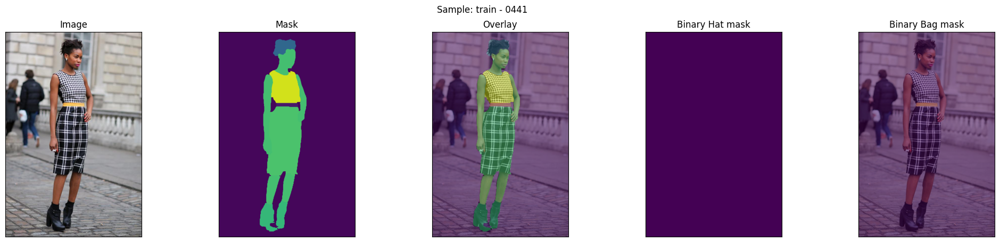

In [5]:
# Inspect a randomly taken sample
import matplotlib.pyplot as plt
from skimage.io import imread
import os
import numpy as np

r = df.sample(1).iloc[0]

x = imread(r.image_path)
y = imread(r.mask_path)


f, ax = plt.subplots(1, 5, figsize=(25, 5))

f.suptitle(f'Sample: {r.set} - {os.path.basename(r.image_path).split(".")[0]} ')

ax[0].imshow(x)
ax[0].set_xticks([])
ax[0].set_yticks([])
ax[0].set_title('Image')

ax[1].imshow(y)
ax[1].set_xticks([])
ax[1].set_yticks([])
ax[1].set_title('Mask')

ax[2].imshow(x)
ax[2].imshow(y, alpha=.5)
ax[2].set_xticks([])
ax[2].set_yticks([])
ax[2].set_title('Overlay')

hat_mask = (y != np.array([46, 107, 142])).any(-1) # [69,  6, 90] RGB values = background
ax[3].imshow(hat_mask)
ax[3].set_xticks([])
ax[3].set_yticks([])
ax[3].set_title('Binary Hat mask')




bag_mask = (y != np.array([71, 18, 101])).any(-1)
    
ax[4].imshow(x)
ax[4].imshow(bag_mask, alpha=.5)
ax[4].set_xticks([])
ax[4].set_yticks([])
ax[4].set_title('Binary Bag mask')

plt.show()

We start by creating a function that extracts a <span style="color:#D52B29">random patch</span> from an image and assigns it the class corresponding to the <span style="color:#D52B29">central pixel</span> of the patch. It is important to note that, for model training, we will select <span style="color:#D52B29">random patches</span> from the images, since extracting all possible patches corresponding to every pixel in the training images would be <span style="color:#D52B29">computationally infeasible</span>.

In [6]:
def random_crop(img, mask, patch_size=224):
    """
    Take a random [patch_size, patch_size, :] window from an image [H, W, :] and corresponding mask [H, W, :].
    
    Args:
        img: numpy array of shape [H, W, :]
        mask: numpy array of shape [H, W, :]
        patch_size: patch size (int)
    
    Returns:
        img_patch: numpy array of shape [patch_size, patch_size, 3]
        mask_patch: numpy array of shape [patch_size, patch_size, 3]
    """
    H, W, _ = img.shape
        
    # Random top-left corner
    y = np.random.randint(0, H - patch_size + 1)
    x = np.random.randint(0, W - patch_size + 1)
    
    # Extract patch
    img_patch = img[y:y+patch_size, x:x+patch_size, :]
    mask_patch = mask[y:y+patch_size, x:x+patch_size, :]
    
    return img_patch, mask_patch

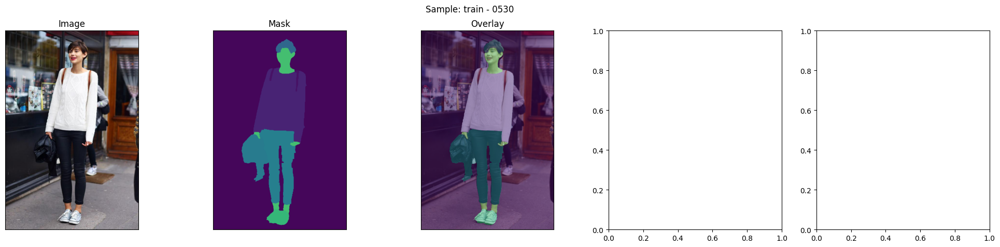

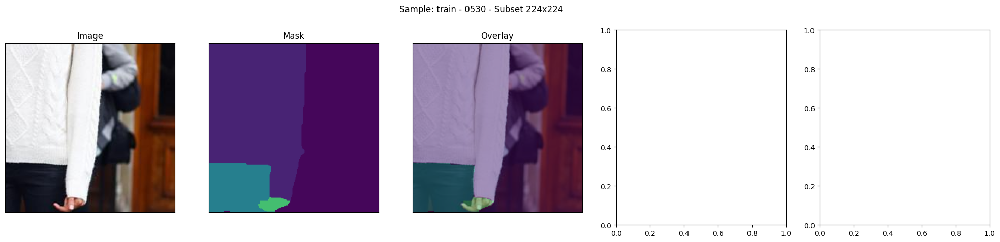

In [5]:
# Inspect a randomly taken sample
import matplotlib.pyplot as plt
from skimage.io import imread
import os
import numpy as np

r = df.sample(1).iloc[0]

x = imread(r.image_path)
y = imread(r.mask_path)

f, ax = plt.subplots(1, 5, figsize=(25, 5))

f.suptitle(f'Sample: {r.set} - {os.path.basename(r.image_path).split(".")[0]} ')

ax[0].imshow(x)
ax[0].set_xticks([])
ax[0].set_yticks([])
ax[0].set_title('Image')

ax[1].imshow(y)
ax[1].set_xticks([])
ax[1].set_yticks([])
ax[1].set_title('Mask')

ax[2].imshow(x)
ax[2].imshow(y, alpha=.5)
ax[2].set_xticks([])
ax[2].set_yticks([])
ax[2].set_title('Overlay')

# binary_mask = (y != np.array([69,  6, 90])).any(-1) # [69,  6, 90] RGB values = background
# ax[3].imshow(binary_mask)
# ax[3].set_xticks([])
# ax[3].set_yticks([])
# ax[3].set_title('Binary Mask')

# ax[4].imshow(x)
# ax[4].imshow(binary_mask, alpha=.5)
# ax[4].set_xticks([])
# ax[4].set_yticks([])
# ax[4].set_title('Overlay')

plt.show()

# Subset

img_patch, mask_patch = random_crop(x, y, patch_size=224)

f, ax = plt.subplots(1, 5, figsize=(25, 5))

f.suptitle(f'Sample: {r.set} - {os.path.basename(r.image_path).split(".")[0]} - Subset 224x224')

ax[0].imshow(img_patch)
ax[0].set_xticks([])
ax[0].set_yticks([])
ax[0].set_title('Image')

ax[1].imshow(mask_patch)
ax[1].set_xticks([])
ax[1].set_yticks([])
ax[1].set_title('Mask')

ax[2].imshow(img_patch)
ax[2].imshow(mask_patch, alpha=.5)
ax[2].set_xticks([])
ax[2].set_yticks([])
ax[2].set_title('Overlay')

# binary_mask_patch = (mask_patch != np.array([69,  6, 90])).any(-1) # [69,  6, 90] RGB values = background
# ax[3].imshow(binary_mask_patch)
# ax[3].set_xticks([])
# ax[3].set_yticks([])
# ax[3].set_title('Binary Mask')

# ax[4].imshow(img_patch)
# ax[4].imshow(binary_mask_patch, alpha=.5)
# ax[4].set_xticks([])
# ax[4].set_yticks([])
# ax[4].set_title('Overlay')

plt.show()

In [8]:
mask_patch.shape

(224, 224, 3)

What we will do next is create a <span style="color:#D52B29">PyTorch Dataset</span> that takes as input a <span style="color:#D52B29">DataFrame</span> where each row corresponds to one example of the dataset. The <span style="color:#D52B29">getitem()</span> function will load the example at index <span style="color:#D52B29">idx</span>. That is, it will read the image and its corresponding mask, extract a <span style="color:#D52B29">random patch of size 224×224</span>, and then apply transformations to the input image, such as <span style="color:#D52B29">normalization using ImageNet statistics</span>.

In [6]:
import torch

In [7]:
from torchvision.transforms import v2

In [8]:
from torchvision.models import ResNet18_Weights

In [9]:
weights = ResNet18_Weights.IMAGENET1K_V1
transforms = weights.transforms()
# ds = CCPDataset(df, patch_size=224, transforms=transforms)

In [13]:
# rndm_idx = torch.randint(ds.__len__(), [1]).item()
# x, y = ds.__getitem__(rndm_idx)
# ds.__show_item__(x, y)

Once we have the <span style="color:#D52B29">Dataset</span>, we can create the <span style="color:#D52B29">DataLoaders</span> using the <span style="color:#D52B29">DataModule</span> class.

In [10]:
# --- IMPORTS ---
import lightning.pytorch as pl
import torch
import numpy as np
from skimage.io import imread
from torch.utils.data import DataLoader
import torchvision
import torchvision.transforms.v2 as T
from torchvision import tv_tensors  # <--- CRITICAL FOR MASKS

# --- DATASET ---
class CCPDataset(torch.utils.data.Dataset):

    def __init__(self, df, class_df=None, patch_size=224, transforms=None, mode='train'):
        super(CCPDataset, self).__init__()
        self.df = df
        self.ps = patch_size
        self.transforms = transforms
        self.mode = mode
        
        # 1. Multiclass LUT Setup
        if class_df is not None:
            self.color_to_class = np.zeros((256, 256, 256), dtype=np.int64)
            self.color_to_class.fill(0) 
            for index, row in class_df.iterrows():
                r, g, b = int(row['r']), int(row['g']), int(row['b'])
                self.color_to_class[r, g, b] = index
        else:
            self.color_to_class = None

    def __getitem__(self, idx):
        row = self.df.iloc[idx]

        # 1. Read Images
        x = imread(row.image_path)
        y = imread(row.mask_path)

        # 2. Handle Grayscale/RGBA -> RGB
        if x.ndim == 2: x = np.stack([x]*3, axis=-1)
        elif x.ndim == 3 and x.shape[2] == 4: x = x[:, :, :3]
        if y.ndim == 3 and y.shape[2] == 4: y = y[:, :, :3]

        # 3. Handle Eval Mode (Deterministic Crop)
        if self.mode == 'eval':
            r_start, c_start = row.coords
            x = x[r_start:r_start+self.ps, c_start:c_start+self.ps]
            y = y[r_start:r_start+self.ps, c_start:c_start+self.ps]
        
        # 4. Color Mapping (RGB -> Class Index)
        y_indices = self.color_to_class[y[:, :, 0], y[:, :, 1], y[:, :, 2]]

        # 5. Prepare Tensors (Wrap in tv_tensors to ensure v2 works correctly)
        x = torch.from_numpy(x).permute(2, 0, 1) # (C, H, W)
        y = torch.from_numpy(y_indices)          # (H, W)
        
        # WRAP: This tells v2 that 'y' is a Mask (use Nearest Neighbor resize)
        # and 'x' is an Image.
        x = tv_tensors.Image(x)
        y = tv_tensors.Mask(y)

        # 6. Apply Transforms
        if self.transforms:
            if isinstance(self.transforms, (tuple, list)) and len(self.transforms) == 2:
                t_joint, t_img = self.transforms
                
                if self.mode == 'train':
                    # JOINT: RandomCrop + Resize
                    # Because y is wrapped in tv_tensors.Mask, Resize works correctly!
                    x, y = t_joint(x, y) 
                    
                    # IMAGE ONLY: Normalize
                    x = t_img(x)
                else:
                    # EVAL: Just Normalize (we cropped manually above)
                    x = t_img(x)
            else:
                x = self.transforms(x)

        # 7. Final Output
        # y is likely still tv_tensors.Mask, convert to pure LongTensor
        
        y = y.data.long().unsqueeze(0) # (1, H, W)
        # y = (torchvision.transforms.functional.to_tensor(y) * 255).type(torch.long)

        # return x, y
        return x, y.squeeze(0) # (H, W)

    def __len__(self): 
        return self.df.shape[0]

# --- DATAMODULE (Re-define to use new CCPDataset) ---
class DataModule(pl.LightningDataModule):
    def __init__(self, df, classes, bs=64, ps=224):
        super().__init__()
        self.df = df
        self.classes = classes
        self.bs = bs
        self.ps = ps

    def patch_origins(self, h, w, ps, overlap=.5):
        if ps > h or ps > w: raise ValueError("Patch too big")
        stride = int(ps * overlap)
        if stride <= 0: raise ValueError("Stride too small")
        hs = list(range(0, h - ps + 1, stride))
        ws = list(range(0, w - ps + 1, stride))
        if hs[-1] != h - ps: hs.append(h - ps)
        if ws[-1] != w - ps: ws.append(w - ps)
        return np.array([(h, w) for h in hs for w in ws], dtype=int)

    def setup(self, stage=None): 
        # Defines transforms
        train_transforms = (
            T.Compose([
                T.RandomCrop((self.ps, self.ps)), 
                T.Resize(size=(224, 224), antialias=True), 
            ]),
            T.Compose([
                T.ToImage(), 
                T.ToDtype(torch.float32, scale=True),
                T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
            ])
        )

        eval_transforms = (
            T.Compose([ T.Resize(size=(224, 224), antialias=True) ]),
            T.Compose([
                T.ToImage(), 
                T.ToDtype(torch.float32, scale=True),
                T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
            ])
        )
        
        # Instantiate Datasets
        self.train_ds = CCPDataset(
            df=self.df.query('set == "train"'), 
            class_df=self.classes,    
            patch_size=self.ps, 
            transforms=train_transforms,
            mode='train'
        )

        # Build Validation with Patches
        valid_df = self.df.query('set == "valid"').copy()
        valid_df['coords'] = valid_df.image_path.apply(
            lambda x : self.patch_origins(*imread(x).shape[:-1], ps=self.ps, overlap=1).tolist()
        )
        valid_df = valid_df.explode('coords')

        self.valid_ds = CCPDataset(
            df=valid_df, 
            class_df=self.classes,
            patch_size=self.ps, 
            transforms=eval_transforms, 
            mode='eval'
        )
        
        # Build Test with Patches
        test_df = self.df.query('set == "test"').copy()
        test_df['coords'] = test_df.image_path.apply(
            lambda x : self.patch_origins(*imread(x).shape[:-1], ps=self.ps, overlap=1).tolist()
        )
        test_df = test_df.explode('coords')

        self.test_ds = CCPDataset(
            df=test_df, 
            class_df=self.classes,
            patch_size=self.ps, 
            transforms=eval_transforms, 
            mode='eval'
        )

    def train_dataloader(self): 
        return DataLoader(self.train_ds, batch_size=self.bs, shuffle=True, num_workers=2)

    def val_dataloader(self): 
        return DataLoader(self.valid_ds, batch_size=self.bs, shuffle=False, num_workers=2)

    def test_dataloader(self): 
        return DataLoader(self.test_ds, batch_size=self.bs, shuffle=False, num_workers=2)

# --- EXECUTION ---
# 1. Re-instantiate DataModule (This clears the old class logic)
data_module = DataModule(df, classes, bs=64, ps=224)
data_module.setup('train')

# 2. Test
print("Testing Batch Generation...")
batch = next(iter(data_module.train_dataloader()))
print(f"Success! Batch X: {batch[0].shape}, Batch Y: {batch[1].shape}")

Testing Batch Generation...
Success! Batch X: torch.Size([64, 3, 224, 224]), Batch Y: torch.Size([64, 224, 224])


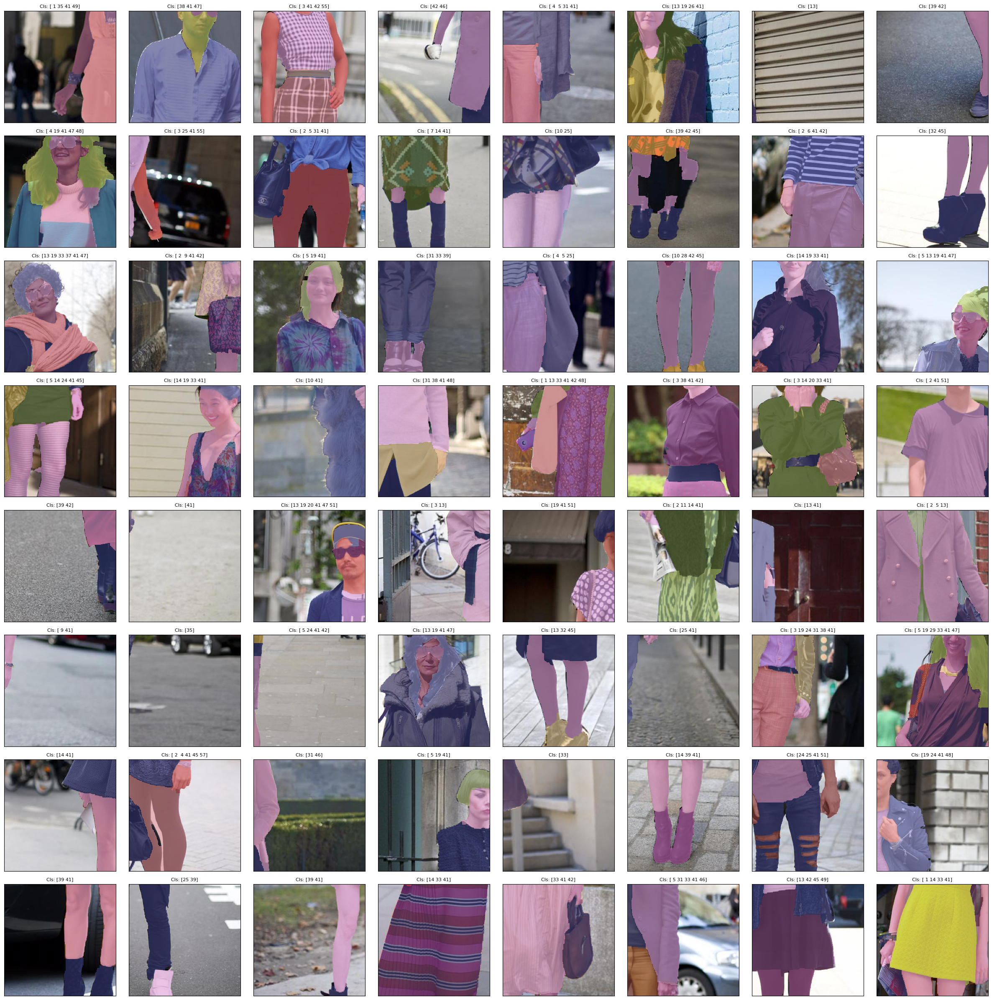

In [11]:
import matplotlib.pyplot as plt

# Define Un-Normalization (Reverse ImageNet stats)
# x_new = x * std + mean
mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)

def denormalize(img_tensor):
    return (img_tensor * std + mean).clamp(0, 1)

# Get a batch
batch = next(iter(data_module.train_dataloader()))
images, masks = batch

# Setup plot
f, ax = plt.subplots(8, 8, figsize=(24, 24))
ax = ax.ravel()

for i in range(64):
    # 1. Denormalize image for display
    img_vis = denormalize(images[i]).permute(1, 2, 0).numpy()
    
    # 2. Get the mask (Integers 0-58)
    mask_vis = masks[i].numpy()
    
    # 3. Plot Image
    ax[i].imshow(img_vis)
    
    # 4. Overlay Mask (with transparency)
    # We filter out class 0 (background) so the image is visible
    masked_data = np.ma.masked_where(mask_vis == 0, mask_vis)
    ax[i].imshow(masked_data, cmap='tab20b', alpha=0.6, interpolation='nearest')
    
    # Clean up axes
    ax[i].set_xticks([])
    ax[i].set_yticks([])
    
    # Optional: Title shows unique classes found in this patch
    unique_classes = np.unique(mask_vis)
    unique_classes = unique_classes[unique_classes != 0] # Remove background
    if len(unique_classes) > 0:
        ax[i].set_title(f"Cls: {unique_classes}", fontsize=8)
    else:
        ax[i].set_title("Background", fontsize=8, color='gray')

plt.tight_layout()
plt.show()

## <span style="color:#D52B29">Encoder-Decoder Architecture</span>

In previous sections, we saw that convolutional networks used for classification extract information from the original image at multiple levels. Each level compresses information more, producing richer features. However, in the first strategy (sliding window), this does not help for segmentation since we would need to classify pixel by pixel.

The second strategy we explored does not compress the information and works at the original resolution, allowing segmentation in a single pass. Unfortunately, it is also not ideal due to the high computational cost.

The solution is to <span style="color:#D52B29">combine both approaches</span>. We will use <span style="color:#D52B29">FCNNs that internally compress and decompress information</span>. Pooling layers reduce dimensionality (<span style="color:#D52B29">encoder</span>), while deconvolution or upsampling layers restore it (<span style="color:#D52B29">decoder</span>). Additionally, most architectures include <span style="color:#D52B29">skip-connections</span> that transfer information from the encoder to the decoder for more precise reconstruction.

Among encoder-decoder architectures, there are many variations. Fastai focuses on the most widely used one due to its strong generalization across tasks: the <span style="color:#D52B29">U-Net</span>, named after the "U" shape of its structure, as illustrated below.

![Arquitectura Unet](https://lmb.informatik.uni-freiburg.de/people/ronneber/u-net/u-net-architecture.png)

Imagen from: [U-Net: Convolutional Networks for Biomedical Image Segmentation
](https://lmb.informatik.uni-freiburg.de/people/ronneber/u-net/#:~:text=The%20u%2Dnet%20is%20convolutional,and%20precise%20segmentation%20of%20images.&text=U%2Dnet%20architecture%20(example%20for,on%20top%20of%20the%20box.).

As we can see, the architecture starts with a CNN-like <span style="color:#D52B29">encoder</span>, consisting of convolutional and pooling layers. This part can be replaced with any CNN we’ve seen before (e.g., <span style="color:#D52B29">ResNet</span>), also called the <span style="color:#D52B29">backbone</span>. After compression, the <span style="color:#D52B29">decoder</span> uses upsampling and convolutional layers to restore spatial resolution. The horizontal arrows are <span style="color:#D52B29">skip-connections</span>, which pass features from each encoder level to the corresponding decoder layer, improving spatial accuracy.

Although there are technical complexities like undoing pooling (<span style="color:#D52B29">upsampling</span>) or implementing deconvolutions, these details are abstracted when using Fastai’s <span style="color:#D52B29">U-Net</span> implementation, so we will focus on its practical use rather than the low-level operations.

To implement the <span style="color:#D52B29">U-Net</span> and other more advanced semantic segmentation architectures, we will use the <span style="color:#D52B29">Segmentation Models PyTorch</span> library. This library allows us to easily choose different encoders and configure various internal parameters of the network.

Next, we will see how to instantiate a <span style="color:#D52B29">U-Net</span> that uses a <span style="color:#D52B29">ResNet18 encoder</span> pre-trained on ImageNet.

In [16]:
# !uv pip install segmentation_models_pytorch

Using Python 3.13.7 environment at: /home/alumno/py313ml/.venv
Audited 1 package in 6ms


In [5]:
import segmentation_models_pytorch as smp

In [6]:
n_classes = len(classes)

In [19]:
# model = smp.Unet(
#     encoder_name='resnet18',
#     encoder_weights='imagenet',
#     in_channels=3,
#     classes=n_classes
# )

# model

In [20]:
# x = torch.rand(1, 3, 256, 256)
# y_hat = model(x)
# y_hat.shape

We are now going to modify the <span style="color:#D52B29">LightningModule</span> to make use of this new <span style="color:#D52B29">U-Net model</span> and train it with the same parametrization as in the previous experiments, ensuring a <span style="color:#D52B29">fair comparison</span>.

## Trying the new models

In [17]:
class CCP_SegmentationModel(pl.LightningModule):
    def __init__(self, model, n_classes=59):
        super().__init__()
        self.save_hyperparameters(ignore=['model'])
        
        self.model = model

        # FIX 1: Assign FocalLoss correctly. 
        # Note: No 'from_logits=True' needed here, SMP handles it.
        self.loss_fn = smp.losses.DiceLoss(mode='multiclass', from_logits=True)

    def forward(self, x):
        return self.model(x)

    def configure_optimizers(self):
        # FIX 2: Lower Learning Rate to prevent collapse
        optimizer = torch.optim.Adam(self.parameters(), lr=1e-3)
        return {"optimizer": optimizer}

    def training_step(self, batch, batch_idx):
        x, y = batch
        logits = self(x)
        
        # Shape Check
        if y.ndim == 4: y = y.squeeze(1)
            
        loss = self.loss_fn(logits, y)
        
        self.log('train_loss', loss, on_step=False, on_epoch=True, prog_bar=True)
        return loss

    def validation_step(self, batch, batch_idx):
        x, y = batch
        logits = self(x)
        if y.ndim == 4: y = y.squeeze(1)

        loss = self.loss_fn(logits, y)
        self.log('val_loss', loss, on_step=False, on_epoch=True, prog_bar=True)
        return loss

In [20]:
from lightning.pytorch.loggers import CSVLogger
import os

unet_model = smp.Unet(
            encoder_name='resnet18',
            encoder_weights='imagenet',
            in_channels=3,
            classes=n_classes
        )

unetplusplus_model = smp.UnetPlusPlus(
            encoder_name='resnet18',
            encoder_weights='imagenet',
            in_channels=3,
            classes=n_classes
        )

upernet_model = smp.UPerNet(
            encoder_name='resnet18',
            encoder_weights='imagenet',
            in_channels=3,
            classes=n_classes
        )

deeplab_model = smp.DeepLabV3Plus(
            encoder_name='resnet18',
            encoder_weights='imagenet',
            in_channels=3,
            classes=n_classes
        )


🔒 Semilla fijada en: 123


In [22]:
models = [unet_model]#, unetplusplus_model, upernet_model, deeplab_model]
names = ["Unet"] # "Unet++", "UPerNet", "DeepLabV3+"]
# Set random seed for reproducibility
pl.seed_everything(seed=42, workers=True)

for model, name in zip(models, names):

    # Intantiate LightningModule
    lightning_module = CCP_SegmentationModel(model)
    
    # Define a CSV logger to store training/validation metrics in CSV format.
    csv_logger = CSVLogger(save_dir=os.getcwd(), name="ccp_"+name)
    
    # Define a checkpoint callback:
    # It will save the model with the lowest validation loss ("best_valid_loss.ckpt").
    model_checkpoint_callback = pl.callbacks.model_checkpoint.ModelCheckpoint(
        monitor='val_loss',mode='min', filename='best_valid_loss', verbose=True, save_last=False)
    
    # Create a PyTorch Lightning trainer
    trainer = pl.Trainer(max_epochs=30, logger=csv_logger, callbacks=[model_checkpoint_callback])
    
    # Load the data module
    data_module = DataModule(df, classes, bs=64, ps=224)#, transforms=transforms)
    
    torch.set_float32_matmul_precision('medium')
    
    # Train the model with the trainer, passing the core LightningModule and data module.
    trainer.fit(lightning_module, data_module)

Seed set to 42
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name    | Type     | Params | Mode 
---------------------------------------------
0 | model   | Unet     | 14.3 M | eval 
1 | loss_fn | DiceLoss | 0      | train
---------------------------------------------
14.3 M    Trainable params
0         Non-trainable params
14.3 M    Total params
57.346    Total estimated model params size (MB)
1         Modules in train mode
140       Modules in eval mode


Sanity Checking: |                                        | 0/? [00:00<?, ?it/s]

/home/alumno/py313ml/.venv/lib/python3.13/site-packages/lightning/pytorch/loops/fit_loop.py:310: The number of training batches (11) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
/home/alumno/py313ml/.venv/lib/python3.13/site-packages/lightning/pytorch/loops/fit_loop.py:527: Found 140 module(s) in eval mode at the start of training. This may lead to unexpected behavior during training. If this is intentional, you can ignore this warning.


Training: |                                               | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 0, global step 11: 'val_loss' reached 0.31459 (best 0.31459), saving model to '/home/alumno/Desktop/datos/Computer_vision/Assigment 4/ccp_Unet_imp/version_0/checkpoints/best_valid_loss.ckpt' as top 1


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 1, global step 22: 'val_loss' was not in top 1


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 2, global step 33: 'val_loss' was not in top 1


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 3, global step 44: 'val_loss' was not in top 1


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 4, global step 55: 'val_loss' was not in top 1


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 5, global step 66: 'val_loss' was not in top 1


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 6, global step 77: 'val_loss' was not in top 1


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 7, global step 88: 'val_loss' was not in top 1


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 8, global step 99: 'val_loss' was not in top 1


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 9, global step 110: 'val_loss' was not in top 1


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 10, global step 121: 'val_loss' was not in top 1


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 11, global step 132: 'val_loss' was not in top 1


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 12, global step 143: 'val_loss' was not in top 1


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 13, global step 154: 'val_loss' was not in top 1


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 14, global step 165: 'val_loss' was not in top 1


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 15, global step 176: 'val_loss' was not in top 1


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 16, global step 187: 'val_loss' was not in top 1


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 17, global step 198: 'val_loss' was not in top 1


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 18, global step 209: 'val_loss' was not in top 1


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 19, global step 220: 'val_loss' was not in top 1


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 20, global step 231: 'val_loss' was not in top 1


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 21, global step 242: 'val_loss' was not in top 1


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 22, global step 253: 'val_loss' was not in top 1


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 23, global step 264: 'val_loss' was not in top 1


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 24, global step 275: 'val_loss' was not in top 1


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 25, global step 286: 'val_loss' was not in top 1


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 26, global step 297: 'val_loss' was not in top 1


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 27, global step 308: 'val_loss' was not in top 1


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 28, global step 319: 'val_loss' was not in top 1


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 29, global step 330: 'val_loss' was not in top 1
`Trainer.fit` stopped: `max_epochs=30` reached.


**UNET PREDICTIONS**


Processing: Unet
✅ Saved convergence plot for Unet
Loading weights from: /home/alumno/Desktop/datos/Computer_vision/Assigment 4/ccp_Unet/version_1/checkpoints/best_valid_loss.ckpt
Running Inference on Test Set for Unet...


Results for Unet:
pixel_acc        0.812459
iou_macro        0.116046
iou_weighted     0.780192
dice_macro       0.139095
dice_weighted    0.827931
Model                Unet
dtype: object

Processing: Unet++
✅ Saved convergence plot for Unet++
Loading weights from: /home/alumno/Desktop/datos/Computer_vision/Assigment 4/ccp_Unet++/version_2/checkpoints/best_valid_loss.ckpt
Running Inference on Test Set for Unet++...


Results for Unet++:
pixel_acc        0.824646
iou_macro        0.091503
iou_weighted     0.786061
dice_macro         0.1104
dice_weighted    0.832251
Model              Unet++
dtype: object

Processing: UPerNet
✅ Saved convergence plot for UPerNet
Loading weights from: /home/alumno/Desktop/datos/Computer_vision/Assigment 4/ccp_UPerNet/version_1/checkpoints/best_valid_loss.ckpt
Running Inference on Test Set for UPerNet...


Results for UPerNet:
pixel_acc        0.816064
iou_macro        0.114384
iou_weighted     0.781481
dice_macro       0.139347
dice_weighted    0.826222
Model             UPerNet
dtype: object

Processing: DeepLabV3+
✅ Saved convergence plot for DeepLabV3+
Loading weights from: /home/alumno/Desktop/datos/Computer_vision/Assigment 4/ccp_DeepLabV3+/version_0/checkpoints/best_valid_loss.ckpt
Running Inference on Test Set for DeepLabV3+...


Results for DeepLabV3+:
pixel_acc          0.815209
iou_macro          0.101004
iou_weighted       0.779239
dice_macro         0.122899
dice_weighted      0.825991
Model            DeepLabV3+
dtype: object

FINAL LEADERBOARD
            pixel_acc  iou_macro  iou_weighted  dice_macro  dice_weighted
Model                                                                    
Unet         0.812459   0.116046      0.780192    0.139095       0.827931
Unet++       0.824646   0.091503      0.786061    0.110400       0.832251
UPerNet      0.816064   0.114384      0.781481    0.139347       0.826222
DeepLabV3+   0.815209   0.101004      0.779239    0.122899       0.825991


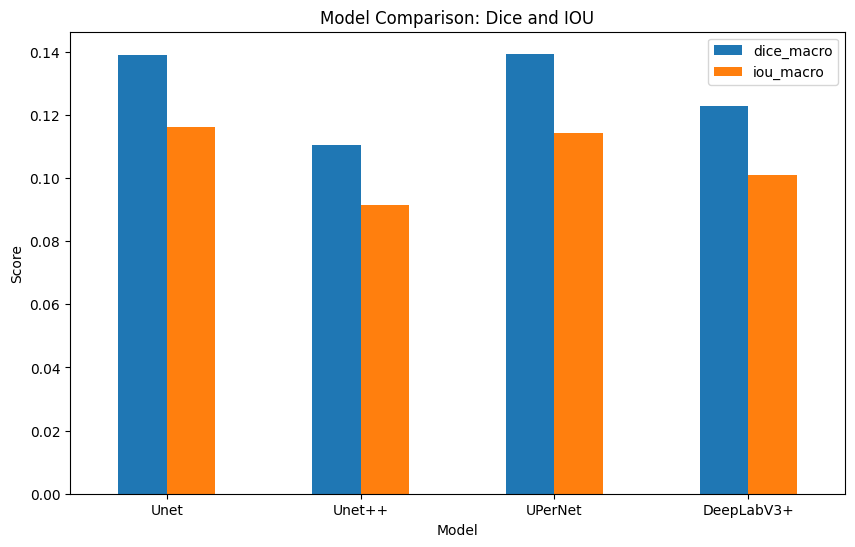

In [17]:
import torch
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import torchvision.transforms.v2 as T
from fastprogress import master_bar, progress_bar
from torch import nn
from skimage.io import imread
from sklearn.metrics import accuracy_score, jaccard_score, f1_score
import segmentation_models_pytorch as smp
import glob
import os

# --- 1. GLOBAL SETUP (Run Once) ---

# Color Mapping
color_to_class = np.zeros((256, 256, 256), dtype=np.int64)
color_to_class.fill(0) 
for index, row in classes.iterrows():
    r, g, b = int(row['r']), int(row['g']), int(row['b'])
    color_to_class[r, g, b] = index

# Transforms
ps = 224
n_classes = 59 
inf_transforms = T.Compose([
    T.ToImage(), 
    T.ToDtype(torch.float32, scale=True), 
    T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# Define the Names used in training
model_names = ["Unet", "Unet++", "UPerNet", "DeepLabV3+"]
final_results = []

# --- 2. LOOP THROUGH MODELS ---

for name in model_names:
    print(f"\n{'='*20}\nProcessing: {name}\n{'='*20}")
    
    # A. LOCATE LOGS AND CHECKPOINTS
    # Construct folder name used in training: "ccp_Unet++_imp"
    log_folder = f"ccp_{name}"
    search_path = os.path.join(os.getcwd(), log_folder, "version_*")
    versions = sorted(glob.glob(search_path))
    
    if not versions:
        print(f"❌ No logs found for {name}. Skipping.")
        continue
        
    latest_version = versions[-1]
    metrics_csv_path = os.path.join(latest_version, "metrics.csv")
    ckpt_path = os.path.join(latest_version, "checkpoints", "best_valid_loss.ckpt")
    
    # B. PLOT TRAINING CURVES
    try:
        metric_df = pd.read_csv(metrics_csv_path)
        # Consolidate epoch rows
        metric_df = metric_df.groupby('epoch', as_index=False).first() 
        
        f, ax = plt.subplots(1, 1, figsize=(10, 5))
        metric_df.train_loss.plot(ax=ax, color='blue', label='train')
        metric_df.val_loss.plot(ax=ax, color='orange', label='val')
        ax.set_xlabel('Epoch')
        ax.set_ylabel('Loss (Focal)')
        ax.set_title(f'Convergence: {name}')
        ax.legend()
        plt.savefig(f"convergence_{name}.png", dpi=200)
        plt.close() # Close plot to save memory
        print(f"✅ Saved convergence plot for {name}")
    except Exception as e:
        print(f"⚠️ Could not plot metrics for {name}: {e}")

    

    # C. RE-INSTANTIATE ARCHITECTURE
    # We must recreate the specific object to pass into load_from_checkpoint
    if name == "Unet":
        arch = smp.Unet(encoder_name='resnet18', encoder_weights='imagenet', in_channels=3, classes=n_classes)
    elif name == "Unet++":
        arch = smp.UnetPlusPlus(encoder_name='resnet18', encoder_weights='imagenet', in_channels=3, classes=n_classes)
    elif name == "UPerNet":
        arch = smp.UPerNet(encoder_name='resnet18', encoder_weights='imagenet', in_channels=3, classes=n_classes)
    elif name == "DeepLabV3+":
        arch = smp.DeepLabV3Plus(encoder_name='resnet18', encoder_weights='imagenet', in_channels=3, classes=n_classes)

    # D. LOAD CHECKPOINT
    print(f"Loading weights from: {ckpt_path}")
    try:
        # CRITICAL: Pass 'model=arch' because we ignored it in save_hyperparameters
        best_model = CCP_SegmentationModel.load_from_checkpoint(
            checkpoint_path=ckpt_path,
            model=arch,
            n_classes=n_classes
        )
        best_model.eval()
        best_model.cuda()
    except Exception as e:
        print(f"❌ Failed to load {name}: {e}")
        continue

    # E. RUN INFERENCE LOOP
    print(f"Running Inference on Test Set for {name}...")
    metric_dict = []
    test_df = df.query('set == "test"')
    mb = master_bar(test_df.iterrows(), total=test_df.shape[0])

    for i, r in mb:
        # Read image and mask
        x = imread(r.image_path)
        y = imread(r.mask_path)
        
        # --- Safety Fixes ---
        if x.ndim == 2: x = np.stack([x]*3, axis=-1)
        elif x.ndim == 3 and x.shape[2] == 4: x = x[:, :, :3]
        if y.ndim == 3 and y.shape[2] == 4: y = y[:, :, :3]

        # Ground Truth indices
        y_true = color_to_class[y[:, :, 0], y[:, :, 1], y[:, :, 2]]
        
        # Sliding Window Config
        h, w = y_true.shape
        coords = DataModule.patch_origins(None, h, w, ps=ps, overlap=1).tolist()
        
        # Accumulators
        y_hat = torch.zeros((n_classes, h, w), dtype=torch.float32, device='cuda')
        y_wei = torch.zeros((1, h, w), dtype=torch.float32, device='cuda') 
        
        # Patch Loop
        for (coord_x, coord_y) in progress_bar(coords, parent=mb):
            xi = x[coord_x:coord_x+ps, coord_y:coord_y+ps]
            xi = inf_transforms(xi) # To Tensor + Normalize

            with torch.no_grad():
                logits = best_model(xi.unsqueeze(0).cuda())
                probs = nn.Softmax(dim=1)(logits)[0] 

            y_hat[:, coord_x:coord_x+ps, coord_y:coord_y+ps] += probs
            y_wei[:, coord_x:coord_x+ps, coord_y:coord_y+ps] += 1

        # Aggregate and Argmax
        y_hat /= y_wei
        y_hat_indices = y_hat.argmax(0).cpu().numpy()

        # Metrics for this image
        metric_dict.append({
            'Model': name,
            'pixel_acc': accuracy_score(y_true.ravel(), y_hat_indices.ravel()),
            'iou_macro': jaccard_score(y_true.ravel(), y_hat_indices.ravel(), average='macro', zero_division=0),
            'iou_weighted': jaccard_score(y_true.ravel(), y_hat_indices.ravel(), average='weighted', zero_division=0),
            'dice_macro': f1_score(y_true.ravel(), y_hat_indices.ravel(), average='macro', zero_division=0),
            'dice_weighted': f1_score(y_true.ravel(), y_hat_indices.ravel(), average='weighted', zero_division=0)
        })

    # Average metrics for this model
    model_mean = pd.DataFrame(metric_dict).mean(numeric_only=True)
    model_mean['Model'] = name # Add name back
    final_results.append(model_mean)
    print(f"Results for {name}:\n{model_mean}")

# --- 3. FINAL COMPARISON ---
print("\n" + "="*30)
print("FINAL LEADERBOARD")
print("="*30)
leaderboard = pd.DataFrame(final_results).set_index('Model')
print(leaderboard)

# Optional: Visual Comparison
leaderboard[['dice_macro', 'iou_macro']].plot(kind='bar', figsize=(10,6))
plt.title("Model Comparison: Dice and IOU")
plt.ylabel("Score")
plt.xticks(rotation=0)
plt.savefig("comparison_initial_models_macro.png", dpi=250)
plt.show()

We will now load the best model and perform inference as before, in order to compute metrics and compare this approach with the previous ones.

In [ ]:
import torch
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import torchvision.transforms.v2 as T
from fastprogress import master_bar, progress_bar
from torch import nn
from skimage.io import imread
from sklearn.metrics import accuracy_score, jaccard_score, f1_score
import segmentation_models_pytorch as smp
import glob
import os

# --- 1. GLOBAL SETUP (Run Once) ---

# Color Mapping
color_to_class = np.zeros((256, 256, 256), dtype=np.int64)
color_to_class.fill(0) 
for index, row in classes.iterrows():
    r, g, b = int(row['r']), int(row['g']), int(row['b'])
    color_to_class[r, g, b] = index

# Transforms
ps = 224
n_classes = 59 
inf_transforms = T.Compose([
    T.ToImage(), 
    T.ToDtype(torch.float32, scale=True), 
    T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# Define the Names used in training
model_names = ["Unet", "Unet++", "UPerNet", "DeepLabV3+"]
final_results = []

# --- 2. LOOP THROUGH MODELS ---

for name in model_names:
    print(f"\n{'='*20}\nProcessing: {name}\n{'='*20}")
    
    # A. LOCATE LOGS AND CHECKPOINTS
    # Construct folder name used in training: "ccp_Unet++_imp"
    log_folder = f"ccp_{name}"
    search_path = os.path.join(os.getcwd(), log_folder, "version_*")
    versions = sorted(glob.glob(search_path))
    
    if not versions:
        print(f"❌ No logs found for {name}. Skipping.")
        continue
        
    latest_version = versions[-1]
    metrics_csv_path = os.path.join(latest_version, "metrics.csv")
    ckpt_path = os.path.join(latest_version, "checkpoints", "best_valid_loss.ckpt")
    
    # B. PLOT TRAINING CURVES
    try:
        metric_df = pd.read_csv(metrics_csv_path)
        # Consolidate epoch rows
        metric_df = metric_df.groupby('epoch', as_index=False).first() 
        
        f, ax = plt.subplots(1, 1, figsize=(10, 5))
        metric_df.train_loss.plot(ax=ax, color='blue', label='train')
        metric_df.val_loss.plot(ax=ax, color='orange', label='val')
        ax.set_xlabel('Epoch')
        ax.set_ylabel('Loss (Focal)')
        ax.set_title(f'Convergence: {name}')
        ax.legend()
        plt.savefig(f"convergence_{name}.png", dpi=200)
        plt.close() # Close plot to save memory
        print(f"✅ Saved convergence plot for {name}")
    except Exception as e:
        print(f"⚠️ Could not plot metrics for {name}: {e}")

    

    # C. RE-INSTANTIATE ARCHITECTURE
    # We must recreate the specific object to pass into load_from_checkpoint
    if name == "Unet++":
        arch = smp.UnetPlusPlus(encoder_name='resnet18', encoder_weights='imagenet', in_channels=3, classes=n_classes)
    elif name == "UPerNet":
        arch = smp.UPerNet(encoder_name='resnet18', encoder_weights='imagenet', in_channels=3, classes=n_classes)
    elif name == "DeepLabV3+":
        arch = smp.DeepLabV3Plus(encoder_name='resnet18', encoder_weights='imagenet', in_channels=3, classes=n_classes)

    # D. LOAD CHECKPOINT
    print(f"Loading weights from: {ckpt_path}")
    try:
        # CRITICAL: Pass 'model=arch' because we ignored it in save_hyperparameters
        best_model = CCP_SegmentationModel.load_from_checkpoint(
            checkpoint_path=ckpt_path,
            model=arch,
            n_classes=n_classes
        )
        best_model.eval()
        best_model.cuda()
    except Exception as e:
        print(f"❌ Failed to load {name}: {e}")
        continue

    # E. RUN INFERENCE LOOP
    print(f"Running Inference on Test Set for {name}...")
    metric_dict = []
    test_df = df.query('set == "test"')
    mb = master_bar(test_df.iterrows(), total=test_df.shape[0])

    for i, r in mb:
        # Read image and mask
        x = imread(r.image_path)
        y = imread(r.mask_path)
        
        # --- Safety Fixes ---
        if x.ndim == 2: x = np.stack([x]*3, axis=-1)
        elif x.ndim == 3 and x.shape[2] == 4: x = x[:, :, :3]
        if y.ndim == 3 and y.shape[2] == 4: y = y[:, :, :3]

        # Ground Truth indices
        y_true = color_to_class[y[:, :, 0], y[:, :, 1], y[:, :, 2]]
        
        # Sliding Window Config
        h, w = y_true.shape
        coords = DataModule.patch_origins(None, h, w, ps=ps, overlap=1).tolist()
        
        # Accumulators
        y_hat = torch.zeros((n_classes, h, w), dtype=torch.float32, device='cuda')
        y_wei = torch.zeros((1, h, w), dtype=torch.float32, device='cuda') 
        
        # Patch Loop
        for (coord_x, coord_y) in progress_bar(coords, parent=mb):
            xi = x[coord_x:coord_x+ps, coord_y:coord_y+ps]
            xi = inf_transforms(xi) # To Tensor + Normalize

            with torch.no_grad():
                logits = best_model(xi.unsqueeze(0).cuda())
                probs = nn.Softmax(dim=1)(logits)[0] 

            y_hat[:, coord_x:coord_x+ps, coord_y:coord_y+ps] += probs
            y_wei[:, coord_x:coord_x+ps, coord_y:coord_y+ps] += 1

        # Aggregate and Argmax
        y_hat /= y_wei
        y_hat_indices = y_hat.argmax(0).cpu().numpy()

        # Metrics for this image
        metric_dict.append({
            'Model': name,
            'pixel_acc': accuracy_score(y_true.ravel(), y_hat_indices.ravel()),
            'iou_macro': jaccard_score(y_true.ravel(), y_hat_indices.ravel(), average='macro', zero_division=0),
            'iou_weighted': jaccard_score(y_true.ravel(), y_hat_indices.ravel(), average='weighted', zero_division=0),
            'dice_macro': f1_score(y_true.ravel(), y_hat_indices.ravel(), average='macro', zero_division=0),
            'dice_weighted': f1_score(y_true.ravel(), y_hat_indices.ravel(), average='weighted', zero_division=0)
        })

    # Average metrics for this model
    model_mean = pd.DataFrame(metric_dict).mean(numeric_only=True)
    model_mean['Model'] = name # Add name back
    final_results.append(model_mean)
    print(f"Results for {name}:\n{model_mean}")

# --- 3. FINAL COMPARISON ---
print("\n" + "="*30)
print("FINAL LEADERBOARD")
print("="*30)
leaderboard = pd.DataFrame(final_results).set_index('Model')
print(leaderboard)

# Optional: Visual Comparison
leaderboard[['dice_macro', 'iou_macro']].plot(kind='bar', figsize=(10,6))
plt.title("Model Comparison: Dice and IOU")
plt.ylabel("Score")
plt.xticks(rotation=0)
plt.savefig("comparison_initial_models_macro.png", dpi=250)
plt.show()

## Time execution

In [25]:
import torch
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import torchvision.transforms.v2 as T
from fastprogress import master_bar, progress_bar
from torch import nn
from skimage.io import imread
from sklearn.metrics import accuracy_score, jaccard_score, f1_score
import segmentation_models_pytorch as smp
import glob
import os
import time  
import random 

# --- 1. GLOBAL SETUP (Run Once) ---

def seed_everything(seed=42):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False # Puede hacer la inferencia un pelín más lenta pero más reproducible

# Fijamos la semilla
SEED = 42
seed_everything(SEED)
print(f"🔒 Semilla fijada en: {SEED}")
# ---------------------------------------------

# Color Mapping (Asumiendo que 'classes' está definido previamente en tu código)
color_to_class = np.zeros((256, 256, 256), dtype=np.int64)
color_to_class.fill(0) 
for index, row in classes.iterrows():
    r, g, b = int(row['r']), int(row['g']), int(row['b'])
    color_to_class[r, g, b] = index

# Transforms
ps = 224
n_classes = 59 
inf_transforms = T.Compose([
    T.ToImage(), 
    T.ToDtype(torch.float32, scale=True), 
    T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# Define the Names used in training
model_names = ["Unet", "Unet++", "UPerNet", "DeepLabV3+"]
# model_names = ["UPerNet"] # Corregido de model_name a model_names para el bucle
final_results = []

# --- 2. LOOP THROUGH MODELS ---

for name in model_names:
    print(f"\n{'='*20}\nProcessing: {name}\n{'='*20}")
    
    # A. LOCATE LOGS AND CHECKPOINTS
    log_folder = f"ccp_{name}"
    search_path = os.path.join(os.getcwd(), log_folder, "version_*")
    versions = sorted(glob.glob(search_path))
    
    if not versions:
        print(f"❌ No logs found for {name}. Skipping.")
        continue
        
    latest_version = versions[-1]
    metrics_csv_path = os.path.join(latest_version, "metrics.csv")
    ckpt_path = os.path.join(latest_version, "checkpoints", "best_valid_loss.ckpt")

    # C. RE-INSTANTIATE ARCHITECTURE
    if name == "Unet":
        arch = smp.Unet(encoder_name='resnet18', encoder_weights='imagenet', in_channels=3, classes=n_classes)
    elif name == "Unet++":
        arch = smp.UnetPlusPlus(encoder_name='resnet18', encoder_weights='imagenet', in_channels=3, classes=n_classes)
    elif name == "UPerNet":
        arch = smp.UPerNet(encoder_name='resnet18', encoder_weights='imagenet', in_channels=3, classes=n_classes)
    elif name == "DeepLabV3+":
        arch = smp.DeepLabV3Plus(encoder_name='resnet18', encoder_weights='imagenet', in_channels=3, classes=n_classes)

    # D. LOAD CHECKPOINT
    print(f"Loading weights from: {ckpt_path}")
    try:
        # Asumiendo que CCP_SegmentationModel está definido en tu código
        best_model = CCP_SegmentationModel.load_from_checkpoint(
            checkpoint_path=ckpt_path,
            model=arch,
            n_classes=n_classes
        )
        best_model.eval()
        best_model.cuda()
    except Exception as e:
        print(f"❌ Failed to load {name}: {e}")
        continue

    # E. RUN INFERENCE LOOP
    print(f"Running Inference on Test Set for {name}...")
    metric_dict = []
    
    # Asegúrate de que 'df' esté definido previamente
    test_df = df.query('set == "test"')
    
    # --- NUEVO: Inicio contador global para este modelo ---
    model_start_time = time.time()
    
    mb = master_bar(test_df.iterrows(), total=test_df.shape[0])

    for i, r in mb:
        
        # --- NUEVO: Inicio contador por imagen ---
        img_start_time = time.time()
        
        # Read image and mask
        x = imread(r.image_path)
        y = imread(r.mask_path)
        
        # --- Safety Fixes ---
        if x.ndim == 2: x = np.stack([x]*3, axis=-1)
        elif x.ndim == 3 and x.shape[2] == 4: x = x[:, :, :3]
        if y.ndim == 3 and y.shape[2] == 4: y = y[:, :, :3]

        # Ground Truth indices
        y_true = color_to_class[y[:, :, 0], y[:, :, 1], y[:, :, 2]]
        
        # Sliding Window Config
        h, w = y_true.shape
        # Asumiendo que DataModule está definido
        coords = DataModule.patch_origins(None, h, w, ps=ps, overlap=1).tolist()
        
        # Accumulators
        y_hat = torch.zeros((n_classes, h, w), dtype=torch.float32, device='cuda')
        y_wei = torch.zeros((1, h, w), dtype=torch.float32, device='cuda') 
        
        # Patch Loop
        for (coord_x, coord_y) in progress_bar(coords, parent=mb):
            xi = x[coord_x:coord_x+ps, coord_y:coord_y+ps]
            xi = inf_transforms(xi) 

            with torch.no_grad():
                logits = best_model(xi.unsqueeze(0).cuda())
                probs = nn.Softmax(dim=1)(logits)[0] 

            y_hat[:, coord_x:coord_x+ps, coord_y:coord_y+ps] += probs
            y_wei[:, coord_x:coord_x+ps, coord_y:coord_y+ps] += 1

        # Aggregate and Argmax
        y_hat /= y_wei
        y_hat_indices = y_hat.argmax(0).cpu().numpy()

        # --- NUEVO: Fin contador por imagen ---
        img_end_time = time.time()
        inference_duration = img_end_time - img_start_time

        # Metrics for this image
        metric_dict.append({
            'Model': name,
            'pixel_acc': accuracy_score(y_true.ravel(), y_hat_indices.ravel()),
            'iou_macro': jaccard_score(y_true.ravel(), y_hat_indices.ravel(), average='macro', zero_division=0),
            'iou_weighted': jaccard_score(y_true.ravel(), y_hat_indices.ravel(), average='weighted', zero_division=0),
            'dice_macro': f1_score(y_true.ravel(), y_hat_indices.ravel(), average='macro', zero_division=0),
            'dice_weighted': f1_score(y_true.ravel(), y_hat_indices.ravel(), average='weighted', zero_division=0),
            'time_sec': inference_duration
        })

    # --- NUEVO: Fin contador global ---
    model_end_time = time.time()
    total_duration = model_end_time - model_start_time
    
    # Average metrics for this model
    model_mean = pd.DataFrame(metric_dict).mean(numeric_only=True)
    model_mean['Model'] = name # Add name back
    
    # Añadimos información de tiempos agregada
    model_mean['avg_time_per_img_sec'] = model_mean['time_sec'] # Es redundante con el mean de arriba, pero más claro
    
    final_results.append(model_mean)
    
    print(f"Results for {name}:\n{model_mean}")
    print(f"⏱️ Total Time inference: {total_duration:.2f}s | Avg per Img: {model_mean['time_sec']:.2f}s")

# --- 3. FINAL COMPARISON ---
print("\n" + "="*30)
print("FINAL LEADERBOARD")
print("="*30)
leaderboard = pd.DataFrame(final_results).set_index('Model')
print(leaderboard)

# Optional: Visual Comparison including Time
# leaderboard[['dice_macro', 'time_sec']].plot(kind='bar', figsize=(12,6), subplots=True)
# plt.savefig("comparison_metrics_and_time.png", dpi=250)
# plt.show()

🔒 Semilla fijada en: 42

Processing: Unet
Loading weights from: /home/alumno/Desktop/datos/Computer_vision/Assigment 4/ccp_Unet/version_1/checkpoints/best_valid_loss.ckpt
Running Inference on Test Set for Unet...


Results for Unet:
pixel_acc               0.812459
iou_macro               0.116046
iou_weighted            0.780192
dice_macro              0.139095
dice_weighted           0.827931
time_sec                0.098565
Model                       Unet
avg_time_per_img_sec    0.098565
dtype: object
⏱️ Total Time inference: 31.91s | Avg per Img: 0.10s

Processing: Unet++
Loading weights from: /home/alumno/Desktop/datos/Computer_vision/Assigment 4/ccp_Unet++/version_2/checkpoints/best_valid_loss.ckpt
Running Inference on Test Set for Unet++...


Results for Unet++:
pixel_acc               0.824646
iou_macro               0.091503
iou_weighted            0.786061
dice_macro                0.1104
dice_weighted           0.832251
time_sec                 0.13112
Model                     Unet++
avg_time_per_img_sec     0.13112
dtype: object
⏱️ Total Time inference: 37.23s | Avg per Img: 0.13s

Processing: UPerNet
Loading weights from: /home/alumno/Desktop/datos/Computer_vision/Assigment 4/ccp_UPerNet/version_1/checkpoints/best_valid_loss.ckpt
Running Inference on Test Set for UPerNet...


Results for UPerNet:
pixel_acc               0.816064
iou_macro               0.114384
iou_weighted            0.781481
dice_macro              0.139347
dice_weighted           0.826222
time_sec                0.104803
Model                    UPerNet
avg_time_per_img_sec    0.104803
dtype: object
⏱️ Total Time inference: 32.90s | Avg per Img: 0.10s

Processing: DeepLabV3+
Loading weights from: /home/alumno/Desktop/datos/Computer_vision/Assigment 4/ccp_DeepLabV3+/version_0/checkpoints/best_valid_loss.ckpt
Running Inference on Test Set for DeepLabV3+...


Results for DeepLabV3+:
pixel_acc                 0.815209
iou_macro                 0.101004
iou_weighted              0.779239
dice_macro                0.122899
dice_weighted             0.825991
time_sec                  0.091154
Model                   DeepLabV3+
avg_time_per_img_sec      0.091154
dtype: object
⏱️ Total Time inference: 30.55s | Avg per Img: 0.09s

FINAL LEADERBOARD
            pixel_acc  iou_macro  iou_weighted  dice_macro  dice_weighted  \
Model                                                                       
Unet         0.812459   0.116046      0.780192    0.139095       0.827931   
Unet++       0.824646   0.091503      0.786061    0.110400       0.832251   
UPerNet      0.816064   0.114384      0.781481    0.139347       0.826222   
DeepLabV3+   0.815209   0.101004      0.779239    0.122899       0.825991   

            time_sec  avg_time_per_img_sec  
Model                                       
Unet        0.098565              0.098565  
Unet++      

## Fin time execution

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import torch
from skimage.io import imread

# 1. Identify the Best Model from the Leaderboard
# We use Weighted IoU as the deciding metric
best_model_name = leaderboard['iou_macro'].idxmax()
print(f"🏆 The Best Model is: {best_model_name}")

# 2. Locate the Checkpoint for the Best Model
log_folder = f"ccp_{best_model_name}"
versions = sorted(glob.glob(os.path.join(os.getcwd(), log_folder, "version_*")))
best_ckpt_path = os.path.join(versions[-1], "checkpoints", "best_valid_loss.ckpt")

# 3. Re-Instantiate the Architecture for the Best Model
if best_model_name == "Unet++":
    best_arch = smp.UnetPlusPlus(encoder_name='resnet18', encoder_weights='imagenet', in_channels=3, classes=n_classes)
elif best_model_name == "UPerNet":
    best_arch = smp.UPerNet(encoder_name='resnet18', encoder_weights='imagenet', in_channels=3, classes=n_classes)
elif best_model_name == "DeepLabV3+":
    best_arch = smp.DeepLabV3Plus(encoder_name='resnet18', encoder_weights='imagenet', in_channels=3, classes=n_classes)

# 4. Load Weights
best_model_loaded = CCP_SegmentationModel.load_from_checkpoint(
    checkpoint_path=best_ckpt_path,
    model=best_arch,
    n_classes=n_classes
)
best_model_loaded.eval()
best_model_loaded.cuda()

# 5. Pick a Sample Image to Visualize
# Let's pick a random one from the test set
random_row = df.query('set == "test"').sample(1).iloc[0]

# --- RUN INFERENCE ON THIS SAMPLE ---
x_vis = imread(random_row.image_path)
y_vis = imread(random_row.mask_path)

# Safety checks
if x_vis.ndim == 2: x_vis = np.stack([x_vis]*3, axis=-1)
elif x_vis.ndim == 3 and x_vis.shape[2] == 4: x_vis = x_vis[:, :, :3]
if y_vis.ndim == 3 and y_vis.shape[2] == 4: y_vis = y_vis[:, :, :3]

# Ground Truth indices
y_true_vis = color_to_class[y_vis[:, :, 0], y_vis[:, :, 1], y_vis[:, :, 2]]

# Sliding Window Logic
h, w = y_true_vis.shape
coords = DataModule.patch_origins(None, h, w, ps=ps, overlap=1).tolist()
y_hat_vis = torch.zeros((n_classes, h, w), dtype=torch.float32, device='cuda')
y_wei_vis = torch.zeros((1, h, w), dtype=torch.float32, device='cuda')

print(f"Generating prediction for {best_model_name}...")
for (coord_x, coord_y) in coords:
    xi = x_vis[coord_x:coord_x+ps, coord_y:coord_y+ps]
    xi = inf_transforms(xi)
    with torch.no_grad():
        logits = best_model_loaded(xi.unsqueeze(0).cuda())
        probs = nn.Softmax(dim=1)(logits)[0]
    y_hat_vis[:, coord_x:coord_x+ps, coord_y:coord_y+ps] += probs
    y_wei_vis[:, coord_x:coord_x+ps, coord_y:coord_y+ps] += 1

y_hat_vis /= y_wei_vis
y_pred_vis = y_hat_vis.argmax(0).cpu().numpy()

# --- 6. VISUALIZATION FUNCTION ---

def decode_segmap(mask_indices, class_df):
    h, w = mask_indices.shape
    rgb_mask = np.zeros((h, w, 3), dtype=np.uint8)
    # Loop only through the unique classes present in this mask
    for idx in np.unique(mask_indices):
        if 0 <= idx < len(class_df):
            color = class_df.iloc[idx][['r', 'g', 'b']].values
            rgb_mask[mask_indices == idx] = color
    return rgb_mask

# Decode
rgb_true_vis = decode_segmap(y_true_vis, classes)
rgb_pred_vis = decode_segmap(y_pred_vis, classes)

# Plot
fig, ax = plt.subplots(1, 3, figsize=(20, 8))

# Original Image
ax[0].imshow(x_vis)
ax[0].set_title("Original Image")
ax[0].axis('off')

# Ground Truth
ax[1].imshow(rgb_true_vis)
ax[1].set_title("Ground Truth")
ax[1].axis('off')

# Prediction
ax[2].imshow(rgb_pred_vis)
ax[2].set_title(f"Prediction ({best_model_name})")
ax[2].axis('off')

save_name = f"best_prediction_{best_model_name}.png"
plt.savefig(save_name, dpi=400, bbox_inches='tight')
print(f"Saved visualization to {save_name}")
plt.show()

As we can see, the results obtained with <span style="color:#D52B29">U-Net</span> are the best so far. We not only gain in <span style="color:#D52B29">efficiency</span> but also in <span style="color:#D52B29">accuracy</span>. This strategy is therefore the one we should follow to tackle <span style="color:#D52B29">semantic segmentation</span> problems.

| Experiment      | Inference time    | Sample | Accuracy | IoU  | Dice |
|:---------------:|:----------------:|:------:|:--------:|:----:|:----:|
| Sliding Window  | 30m* / image     | 0851   | 83.89    | 0.56 | 0.71 |
| FCNN            | 1s / image       | 0851   | 79.76    | 0.34 | 0.51 |
| U-Net           | 1s / image       | 0851   | 94.98    | 0.81 | 0.89 |

*Inference time for the sliding window approach may be reduced applying batches.

There are, of course, other <span style="color:#D52B29">semantic segmentation</span> architectures besides U-Net (although most share the same <span style="color:#D52B29">encoder-decoder</span> principle). The <span style="color:#D52B29">segmentation models pytorch</span> library makes it easy to try out different configurations. I encourage you to experiment with them!

## Upgrading the model
- Use Focal Loss instead of Dice Loss
- Lower LR from 1e-4 to 1e-3

In [12]:
class CCP_SegmentationModel_Improved(pl.LightningModule):
    def __init__(self, model, n_classes=59, ignore_background=False):
        super().__init__()
        self.save_hyperparameters(ignore=['model'])
        
        # self.model = smp.DeepLabV3Plus(
        #     encoder_name='resnet18',
        #     encoder_weights='imagenet',
        #     in_channels=3,
        #     classes=n_classes
        # )
        self.model = model

        # FIX 1: Assign FocalLoss correctly. 
        # Note: No 'from_logits=True' needed here, SMP handles it.
        # self.loss_fn = smp.losses.DiceLoss(mode='multiclass', from_logits=False)
        if ignore_background:
            self.loss_fn = smp.losses.FocalLoss(mode='multiclass', normalized=False, ignore_index=0) # setting this to true made the loss almost 0
        else:
            self.loss_fn = smp.losses.FocalLoss(mode='multiclass', normalized=False) # setting this to true made the loss almost 0            

    def forward(self, x):
        return self.model(x)

    def configure_optimizers(self):
        # FIX 2: Lower Learning Rate to prevent collapse
        optimizer = torch.optim.Adam(self.parameters(), lr=1e-4)
        return {"optimizer": optimizer}

    def training_step(self, batch, batch_idx):
        x, y = batch
        logits = self(x)
        
        # Shape Check
        if y.ndim == 4: y = y.squeeze(1)
            
        loss = self.loss_fn(logits, y)
        
        self.log('train_loss', loss, on_step=False, on_epoch=True, prog_bar=True)
        return loss

    def validation_step(self, batch, batch_idx):
        x, y = batch
        logits = self(x)
        if y.ndim == 4: y = y.squeeze(1)

        loss = self.loss_fn(logits, y)
        self.log('val_loss', loss, on_step=False, on_epoch=True, prog_bar=True)
        return loss

In [26]:
from lightning.pytorch.loggers import CSVLogger
import os

unet_model = smp.Unet(
            encoder_name='resnet18',
            encoder_weights='imagenet',
            in_channels=3,
            classes=n_classes
        )

unetplusplus_model = smp.UnetPlusPlus(
            encoder_name='resnet18',
            encoder_weights='imagenet',
            in_channels=3,
            classes=n_classes
        )

upernet_model = smp.UPerNet(
            encoder_name='resnet18',
            encoder_weights='imagenet',
            in_channels=3,
            classes=n_classes
        )

deeplab_model = smp.DeepLabV3Plus(
            encoder_name='resnet18',
            encoder_weights='imagenet',
            in_channels=3,
            classes=n_classes
        )

# models = [unet_model, unetplusplus_model, upernet_model, deeplab_model]
models = [unet_model]
# names = ["Unet", "Unet++", "UPerNet", "DeepLabV3+"]
names = ["Unet"]
# Set random seed for reproducibility
pl.seed_everything(seed=42, workers=True)

for model, name in zip(models, names):

    # Intantiate LightningModule
    lightning_module = CCP_SegmentationModel_Improved(model)
    
    # Define a CSV logger to store training/validation metrics in CSV format.
    csv_logger = CSVLogger(save_dir=os.getcwd(), name="ccp_"+name+"_imp")
    
    # Define a checkpoint callback:
    # It will save the model with the lowest validation loss ("best_valid_loss.ckpt").
    model_checkpoint_callback = pl.callbacks.model_checkpoint.ModelCheckpoint(
        monitor='val_loss',mode='min', filename='best_valid_loss', verbose=True, save_last=False)
    
    # Create a PyTorch Lightning trainer
    trainer = pl.Trainer(max_epochs=30, logger=csv_logger, callbacks=[model_checkpoint_callback])
    
    # Load the data module
    data_module = DataModule(df, classes, bs=64, ps=224)#, transforms=transforms)
    
    torch.set_float32_matmul_precision('medium')
    
    # Train the model with the trainer, passing the core LightningModule and data module.
    trainer.fit(lightning_module, data_module)

Seed set to 42
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name    | Type      | Params | Mode 
----------------------------------------------
0 | model   | Unet      | 14.3 M | train
1 | loss_fn | FocalLoss | 0      | train
----------------------------------------------
14.3 M    Trainable params
0         Non-trainable params
14.3 M    Total params
57.346    Total estimated model params size (MB)
141       Modules in train mode
0         Modules in eval mode


Sanity Checking: |                                        | 0/? [00:00<?, ?it/s]

/home/alumno/py313ml/.venv/lib/python3.13/site-packages/lightning/pytorch/loops/fit_loop.py:310: The number of training batches (11) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training: |                                               | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 0, global step 11: 'val_loss' reached 10.48401 (best 10.48401), saving model to '/home/alumno/Desktop/datos/Computer_vision/Assigment 4/ccp_Unet_imp/version_1/checkpoints/best_valid_loss.ckpt' as top 1


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 1, global step 22: 'val_loss' reached 9.52716 (best 9.52716), saving model to '/home/alumno/Desktop/datos/Computer_vision/Assigment 4/ccp_Unet_imp/version_1/checkpoints/best_valid_loss.ckpt' as top 1


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 2, global step 33: 'val_loss' reached 8.70612 (best 8.70612), saving model to '/home/alumno/Desktop/datos/Computer_vision/Assigment 4/ccp_Unet_imp/version_1/checkpoints/best_valid_loss.ckpt' as top 1


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 3, global step 44: 'val_loss' reached 7.68806 (best 7.68806), saving model to '/home/alumno/Desktop/datos/Computer_vision/Assigment 4/ccp_Unet_imp/version_1/checkpoints/best_valid_loss.ckpt' as top 1


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 4, global step 55: 'val_loss' reached 6.77076 (best 6.77076), saving model to '/home/alumno/Desktop/datos/Computer_vision/Assigment 4/ccp_Unet_imp/version_1/checkpoints/best_valid_loss.ckpt' as top 1


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 5, global step 66: 'val_loss' reached 5.72866 (best 5.72866), saving model to '/home/alumno/Desktop/datos/Computer_vision/Assigment 4/ccp_Unet_imp/version_1/checkpoints/best_valid_loss.ckpt' as top 1


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 6, global step 77: 'val_loss' reached 4.77937 (best 4.77937), saving model to '/home/alumno/Desktop/datos/Computer_vision/Assigment 4/ccp_Unet_imp/version_1/checkpoints/best_valid_loss.ckpt' as top 1


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 7, global step 88: 'val_loss' reached 4.17733 (best 4.17733), saving model to '/home/alumno/Desktop/datos/Computer_vision/Assigment 4/ccp_Unet_imp/version_1/checkpoints/best_valid_loss.ckpt' as top 1


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 8, global step 99: 'val_loss' reached 3.77109 (best 3.77109), saving model to '/home/alumno/Desktop/datos/Computer_vision/Assigment 4/ccp_Unet_imp/version_1/checkpoints/best_valid_loss.ckpt' as top 1


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 9, global step 110: 'val_loss' reached 3.37538 (best 3.37538), saving model to '/home/alumno/Desktop/datos/Computer_vision/Assigment 4/ccp_Unet_imp/version_1/checkpoints/best_valid_loss.ckpt' as top 1


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 10, global step 121: 'val_loss' reached 3.07443 (best 3.07443), saving model to '/home/alumno/Desktop/datos/Computer_vision/Assigment 4/ccp_Unet_imp/version_1/checkpoints/best_valid_loss.ckpt' as top 1


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 11, global step 132: 'val_loss' reached 2.73392 (best 2.73392), saving model to '/home/alumno/Desktop/datos/Computer_vision/Assigment 4/ccp_Unet_imp/version_1/checkpoints/best_valid_loss.ckpt' as top 1


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 12, global step 143: 'val_loss' reached 2.50331 (best 2.50331), saving model to '/home/alumno/Desktop/datos/Computer_vision/Assigment 4/ccp_Unet_imp/version_1/checkpoints/best_valid_loss.ckpt' as top 1


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 13, global step 154: 'val_loss' reached 2.30262 (best 2.30262), saving model to '/home/alumno/Desktop/datos/Computer_vision/Assigment 4/ccp_Unet_imp/version_1/checkpoints/best_valid_loss.ckpt' as top 1


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 14, global step 165: 'val_loss' reached 2.08722 (best 2.08722), saving model to '/home/alumno/Desktop/datos/Computer_vision/Assigment 4/ccp_Unet_imp/version_1/checkpoints/best_valid_loss.ckpt' as top 1


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 15, global step 176: 'val_loss' reached 1.88902 (best 1.88902), saving model to '/home/alumno/Desktop/datos/Computer_vision/Assigment 4/ccp_Unet_imp/version_1/checkpoints/best_valid_loss.ckpt' as top 1


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 16, global step 187: 'val_loss' reached 1.75385 (best 1.75385), saving model to '/home/alumno/Desktop/datos/Computer_vision/Assigment 4/ccp_Unet_imp/version_1/checkpoints/best_valid_loss.ckpt' as top 1


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 17, global step 198: 'val_loss' reached 1.58902 (best 1.58902), saving model to '/home/alumno/Desktop/datos/Computer_vision/Assigment 4/ccp_Unet_imp/version_1/checkpoints/best_valid_loss.ckpt' as top 1


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 18, global step 209: 'val_loss' reached 1.49943 (best 1.49943), saving model to '/home/alumno/Desktop/datos/Computer_vision/Assigment 4/ccp_Unet_imp/version_1/checkpoints/best_valid_loss.ckpt' as top 1


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 19, global step 220: 'val_loss' reached 1.37462 (best 1.37462), saving model to '/home/alumno/Desktop/datos/Computer_vision/Assigment 4/ccp_Unet_imp/version_1/checkpoints/best_valid_loss.ckpt' as top 1


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 20, global step 231: 'val_loss' reached 1.30109 (best 1.30109), saving model to '/home/alumno/Desktop/datos/Computer_vision/Assigment 4/ccp_Unet_imp/version_1/checkpoints/best_valid_loss.ckpt' as top 1


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 21, global step 242: 'val_loss' reached 1.18554 (best 1.18554), saving model to '/home/alumno/Desktop/datos/Computer_vision/Assigment 4/ccp_Unet_imp/version_1/checkpoints/best_valid_loss.ckpt' as top 1


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 22, global step 253: 'val_loss' reached 1.13301 (best 1.13301), saving model to '/home/alumno/Desktop/datos/Computer_vision/Assigment 4/ccp_Unet_imp/version_1/checkpoints/best_valid_loss.ckpt' as top 1


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 23, global step 264: 'val_loss' reached 1.05658 (best 1.05658), saving model to '/home/alumno/Desktop/datos/Computer_vision/Assigment 4/ccp_Unet_imp/version_1/checkpoints/best_valid_loss.ckpt' as top 1


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 24, global step 275: 'val_loss' reached 1.01047 (best 1.01047), saving model to '/home/alumno/Desktop/datos/Computer_vision/Assigment 4/ccp_Unet_imp/version_1/checkpoints/best_valid_loss.ckpt' as top 1


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 25, global step 286: 'val_loss' reached 0.95808 (best 0.95808), saving model to '/home/alumno/Desktop/datos/Computer_vision/Assigment 4/ccp_Unet_imp/version_1/checkpoints/best_valid_loss.ckpt' as top 1


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 26, global step 297: 'val_loss' reached 0.90653 (best 0.90653), saving model to '/home/alumno/Desktop/datos/Computer_vision/Assigment 4/ccp_Unet_imp/version_1/checkpoints/best_valid_loss.ckpt' as top 1


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 27, global step 308: 'val_loss' reached 0.87164 (best 0.87164), saving model to '/home/alumno/Desktop/datos/Computer_vision/Assigment 4/ccp_Unet_imp/version_1/checkpoints/best_valid_loss.ckpt' as top 1


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 28, global step 319: 'val_loss' reached 0.83341 (best 0.83341), saving model to '/home/alumno/Desktop/datos/Computer_vision/Assigment 4/ccp_Unet_imp/version_1/checkpoints/best_valid_loss.ckpt' as top 1


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 29, global step 330: 'val_loss' reached 0.79877 (best 0.79877), saving model to '/home/alumno/Desktop/datos/Computer_vision/Assigment 4/ccp_Unet_imp/version_1/checkpoints/best_valid_loss.ckpt' as top 1
`Trainer.fit` stopped: `max_epochs=30` reached.



Processing: Unet++
✅ Saved convergence plot for Unet++
Loading weights from: /home/alumno/Desktop/datos/Computer_vision/Assigment 4/ccp_Unet++_imp/version_1/checkpoints/best_valid_loss.ckpt
Running Inference on Test Set for Unet++...


Results for Unet++:
pixel_acc        0.783665
iou_macro        0.064629
iou_weighted     0.759031
dice_macro       0.076154
dice_weighted    0.791651
Model              Unet++
dtype: object

Processing: UPerNet
✅ Saved convergence plot for UPerNet
Loading weights from: /home/alumno/Desktop/datos/Computer_vision/Assigment 4/ccp_UPerNet_imp/version_0/checkpoints/best_valid_loss.ckpt
Running Inference on Test Set for UPerNet...


Results for UPerNet:
pixel_acc        0.861001
iou_macro        0.172887
iou_weighted     0.826328
dice_macro       0.207967
dice_weighted    0.861656
Model             UPerNet
dtype: object

Processing: DeepLabV3+
✅ Saved convergence plot for DeepLabV3+
Loading weights from: /home/alumno/Desktop/datos/Computer_vision/Assigment 4/ccp_DeepLabV3+_imp/version_0/checkpoints/best_valid_loss.ckpt
Running Inference on Test Set for DeepLabV3+...


Results for DeepLabV3+:
pixel_acc          0.815209
iou_macro          0.101004
iou_weighted       0.779239
dice_macro         0.122899
dice_weighted      0.825991
Model            DeepLabV3+
dtype: object

FINAL LEADERBOARD
            pixel_acc  iou_macro  iou_weighted  dice_macro  dice_weighted
Model                                                                    
Unet++       0.783665   0.064629      0.759031    0.076154       0.791651
UPerNet      0.861001   0.172887      0.826328    0.207967       0.861656
DeepLabV3+   0.815209   0.101004      0.779239    0.122899       0.825991


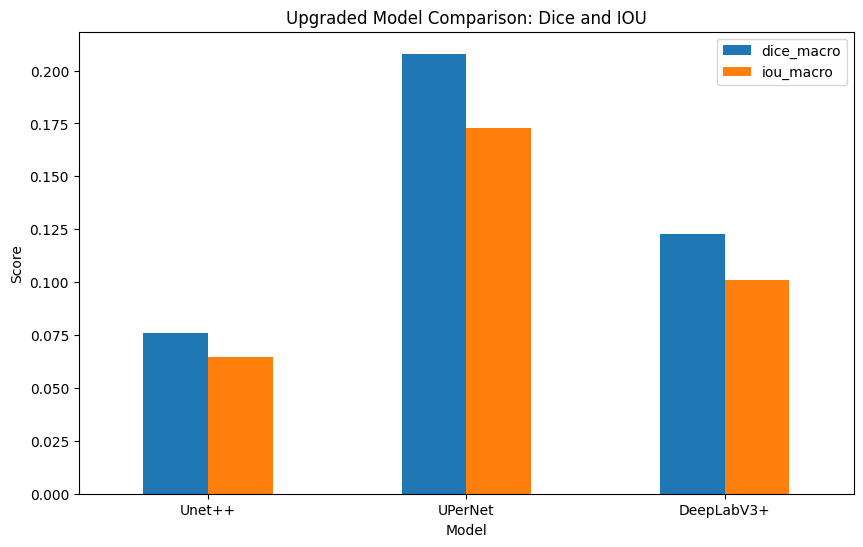

In [13]:
import torch
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import torchvision.transforms.v2 as T
from fastprogress import master_bar, progress_bar
from torch import nn
from skimage.io import imread
from sklearn.metrics import accuracy_score, jaccard_score, f1_score
import segmentation_models_pytorch as smp
import glob
import os

# --- 1. GLOBAL SETUP (Run Once) ---

# Color Mapping
color_to_class = np.zeros((256, 256, 256), dtype=np.int64)
color_to_class.fill(0) 
for index, row in classes.iterrows():
    r, g, b = int(row['r']), int(row['g']), int(row['b'])
    color_to_class[r, g, b] = index

# Transforms
ps = 224
n_classes = 59 
inf_transforms = T.Compose([
    T.ToImage(), 
    T.ToDtype(torch.float32, scale=True), 
    T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# Define the Names used in training
model_names = ["Unet","Unet++", "UPerNet", "DeepLabV3+"]
final_results = []

# --- 2. LOOP THROUGH MODELS ---

for name in model_names:
    print(f"\n{'='*20}\nProcessing: {name}\n{'='*20}")
    
    # A. LOCATE LOGS AND CHECKPOINTS
    # Construct folder name used in training: "ccp_Unet++_imp"
    log_folder = f"ccp_{name}_imp"
    search_path = os.path.join(os.getcwd(), log_folder, "version_*")
    versions = sorted(glob.glob(search_path))
    
    if not versions:
        print(f"❌ No logs found for {name}. Skipping.")
        continue
        
    latest_version = versions[-1]
    metrics_csv_path = os.path.join(latest_version, "metrics.csv")
    ckpt_path = os.path.join(latest_version, "checkpoints", "best_valid_loss.ckpt")
    
    # B. PLOT TRAINING CURVES
    try:
        metric_df = pd.read_csv(metrics_csv_path)
        # Consolidate epoch rows
        metric_df = metric_df.groupby('epoch', as_index=False).first() 
        
        f, ax = plt.subplots(1, 1, figsize=(10, 5))
        metric_df.train_loss.plot(ax=ax, color='blue', label='train')
        metric_df.val_loss.plot(ax=ax, color='orange', label='val')
        ax.set_xlabel('Epoch')
        ax.set_ylabel('Loss (Focal)')
        ax.set_title(f'Convergence: {name} upgraded')
        ax.legend()
        plt.savefig(f"convergence_{name}_imp.png", dpi=200)
        plt.close() # Close plot to save memory
        print(f"✅ Saved convergence plot for {name}")
    except Exception as e:
        print(f"⚠️ Could not plot metrics for {name}: {e}")

    

    # C. RE-INSTANTIATE ARCHITECTURE
    # We must recreate the specific object to pass into load_from_checkpoint
    
    if name == "Unet":
        arch = smp.Unet(encoder_name='resnet18', encoder_weights='imagenet', in_channels=3, classes=n_classes)
    elif name == "Unet++":
        arch = smp.UnetPlusPlus(encoder_name='resnet18', encoder_weights='imagenet', in_channels=3, classes=n_classes)
    elif name == "UPerNet":
        arch = smp.UPerNet(encoder_name='resnet18', encoder_weights='imagenet', in_channels=3, classes=n_classes)
    elif name == "DeepLabV3+":
        arch = smp.DeepLabV3Plus(encoder_name='resnet18', encoder_weights='imagenet', in_channels=3, classes=n_classes)

    # D. LOAD CHECKPOINT
    print(f"Loading weights from: {ckpt_path}")
    try:
        # CRITICAL: Pass 'model=arch' because we ignored it in save_hyperparameters
        best_model = CCP_SegmentationModel_Improved.load_from_checkpoint(
            checkpoint_path=ckpt_path,
            model=arch,
            n_classes=n_classes
        )
        best_model.eval()
        best_model.cuda()
    except Exception as e:
        print(f"❌ Failed to load {name}: {e}")
        continue

    # E. RUN INFERENCE LOOP
    print(f"Running Inference on Test Set for {name}...")
    metric_dict = []
    test_df = df.query('set == "test"')
    mb = master_bar(test_df.iterrows(), total=test_df.shape[0])

    for i, r in mb:
        # Read image and mask
        x = imread(r.image_path)
        y = imread(r.mask_path)
        
        # --- Safety Fixes ---
        if x.ndim == 2: x = np.stack([x]*3, axis=-1)
        elif x.ndim == 3 and x.shape[2] == 4: x = x[:, :, :3]
        if y.ndim == 3 and y.shape[2] == 4: y = y[:, :, :3]

        # Ground Truth indices
        y_true = color_to_class[y[:, :, 0], y[:, :, 1], y[:, :, 2]]
        
        # Sliding Window Config
        h, w = y_true.shape
        coords = DataModule.patch_origins(None, h, w, ps=ps, overlap=1).tolist()
        
        # Accumulators
        y_hat = torch.zeros((n_classes, h, w), dtype=torch.float32, device='cuda')
        y_wei = torch.zeros((1, h, w), dtype=torch.float32, device='cuda') 
        
        # Patch Loop
        for (coord_x, coord_y) in progress_bar(coords, parent=mb):
            xi = x[coord_x:coord_x+ps, coord_y:coord_y+ps]
            xi = inf_transforms(xi) # To Tensor + Normalize

            with torch.no_grad():
                logits = best_model(xi.unsqueeze(0).cuda())
                probs = nn.Softmax(dim=1)(logits)[0] 

            y_hat[:, coord_x:coord_x+ps, coord_y:coord_y+ps] += probs
            y_wei[:, coord_x:coord_x+ps, coord_y:coord_y+ps] += 1

        # Aggregate and Argmax
        y_hat /= y_wei
        y_hat_indices = y_hat.argmax(0).cpu().numpy()

        # Metrics for this image
        metric_dict.append({
            'Model': name,
            'pixel_acc': accuracy_score(y_true.ravel(), y_hat_indices.ravel()),
            'iou_macro': jaccard_score(y_true.ravel(), y_hat_indices.ravel(), average='macro', zero_division=0),
            'iou_weighted': jaccard_score(y_true.ravel(), y_hat_indices.ravel(), average='weighted', zero_division=0),
            'dice_macro': f1_score(y_true.ravel(), y_hat_indices.ravel(), average='macro', zero_division=0),
            'dice_weighted': f1_score(y_true.ravel(), y_hat_indices.ravel(), average='weighted', zero_division=0)
        })

    # Average metrics for this model
    model_mean = pd.DataFrame(metric_dict).mean(numeric_only=True)
    model_mean['Model'] = name # Add name back
    final_results.append(model_mean)
    print(f"Results for {name}:\n{model_mean}")

# --- 3. FINAL COMPARISON ---
print("\n" + "="*30)
print("FINAL LEADERBOARD")
print("="*30)
leaderboard = pd.DataFrame(final_results).set_index('Model')
print(leaderboard)

# Optional: Visual Comparison
leaderboard[['dice_macro', 'iou_macro']].plot(kind='bar', figsize=(10,6))
plt.title("Upgraded Model Comparison: Dice and IOU")
plt.ylabel("Score")
plt.xticks(rotation=0)
plt.savefig("comparison_upgraded_models_macro.png", dpi=250)
plt.show()

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import torch
from skimage.io import imread

# 1. Identify the Best Model from the Leaderboard
# We use macro IoU as the deciding metric
best_model_name = leaderboard['iou_macro'].idxmax()
print(f"🏆 The Best Model is: {best_model_name}")

# 2. Locate the Checkpoint for the Best Model
log_folder = f"ccp_{best_model_name}_imp"
versions = sorted(glob.glob(os.path.join(os.getcwd(), log_folder, "version_*")))
best_ckpt_path = os.path.join(versions[-1], "checkpoints", "best_valid_loss.ckpt")

# 3. Re-Instantiate the Architecture for the Best Model
if best_model_name == "Unet++":
    best_arch = smp.UnetPlusPlus(encoder_name='resnet18', encoder_weights='imagenet', in_channels=3, classes=n_classes)
elif best_model_name == "UPerNet":
    best_arch = smp.UPerNet(encoder_name='resnet18', encoder_weights='imagenet', in_channels=3, classes=n_classes)
elif best_model_name == "DeepLabV3+":
    best_arch = smp.DeepLabV3Plus(encoder_name='resnet18', encoder_weights='imagenet', in_channels=3, classes=n_classes)

# 4. Load Weights
best_model_loaded = CCP_SegmentationModel.load_from_checkpoint(
    checkpoint_path=best_ckpt_path,
    model=best_arch,
    n_classes=n_classes
)
best_model_loaded.eval()
best_model_loaded.cuda()

# 5. Pick a Sample Image to Visualize
# Let's pick a random one from the test set
random_row = df.query('set == "test"').sample(1).iloc[0]

# --- RUN INFERENCE ON THIS SAMPLE ---
x_vis = imread(random_row.image_path)
y_vis = imread(random_row.mask_path)

# Safety checks
if x_vis.ndim == 2: x_vis = np.stack([x_vis]*3, axis=-1)
elif x_vis.ndim == 3 and x_vis.shape[2] == 4: x_vis = x_vis[:, :, :3]
if y_vis.ndim == 3 and y_vis.shape[2] == 4: y_vis = y_vis[:, :, :3]

# Ground Truth indices
y_true_vis = color_to_class[y_vis[:, :, 0], y_vis[:, :, 1], y_vis[:, :, 2]]

# Sliding Window Logic
h, w = y_true_vis.shape
coords = DataModule.patch_origins(None, h, w, ps=ps, overlap=1).tolist()
y_hat_vis = torch.zeros((n_classes, h, w), dtype=torch.float32, device='cuda')
y_wei_vis = torch.zeros((1, h, w), dtype=torch.float32, device='cuda')

print(f"Generating prediction for {best_model_name}...")
for (coord_x, coord_y) in coords:
    xi = x_vis[coord_x:coord_x+ps, coord_y:coord_y+ps]
    xi = inf_transforms(xi)
    with torch.no_grad():
        logits = best_model_loaded(xi.unsqueeze(0).cuda())
        probs = nn.Softmax(dim=1)(logits)[0]
    y_hat_vis[:, coord_x:coord_x+ps, coord_y:coord_y+ps] += probs
    y_wei_vis[:, coord_x:coord_x+ps, coord_y:coord_y+ps] += 1

y_hat_vis /= y_wei_vis
y_pred_vis = y_hat_vis.argmax(0).cpu().numpy()

# --- 6. VISUALIZATION FUNCTION ---

def decode_segmap(mask_indices, class_df):
    h, w = mask_indices.shape
    rgb_mask = np.zeros((h, w, 3), dtype=np.uint8)
    # Loop only through the unique classes present in this mask
    for idx in np.unique(mask_indices):
        if 0 <= idx < len(class_df):
            color = class_df.iloc[idx][['r', 'g', 'b']].values
            rgb_mask[mask_indices == idx] = color
    return rgb_mask

# Decode
rgb_true_vis = decode_segmap(y_true_vis, classes)
rgb_pred_vis = decode_segmap(y_pred_vis, classes)

# Plot
fig, ax = plt.subplots(1, 3, figsize=(20, 8))

# Original Image
ax[0].imshow(x_vis)
ax[0].set_title("Original Image")
ax[0].axis('off')

# Ground Truth
ax[1].imshow(rgb_true_vis)
ax[1].set_title("Ground Truth")
ax[1].axis('off')

# Prediction
ax[2].imshow(rgb_pred_vis)
ax[2].set_title(f"Prediction ({best_model_name})")
ax[2].axis('off')

save_name = f"best_prediction_{best_model_name}_imp.png"
plt.savefig(save_name, dpi=400, bbox_inches='tight')
print(f"Saved visualization to {save_name}")
plt.show()

## Time execution impoved configuration models

🔒 Semilla fijada en: 42

Processing: Unet
✅ Saved convergence plot for Unet
Loading weights from: /home/alumno/Desktop/datos/Computer_vision/Assigment 4/ccp_Unet_imp/version_1/checkpoints/best_valid_loss.ckpt
Running Inference on Test Set for Unet...


Results for Unet:
pixel_acc           0.775169
iou_macro           0.039349
iou_weighted        0.742302
dice_macro          0.044043
dice_weighted       0.769648
time_per_img_sec    0.093365
Model                   Unet
dtype: object
⏱️ Total Time inference: 32.82s

Processing: Unet++
✅ Saved convergence plot for Unet++
Loading weights from: /home/alumno/Desktop/datos/Computer_vision/Assigment 4/ccp_Unet++_imp/version_1/checkpoints/best_valid_loss.ckpt
Running Inference on Test Set for Unet++...


Results for Unet++:
pixel_acc           0.783665
iou_macro           0.064629
iou_weighted        0.759031
dice_macro          0.076154
dice_weighted       0.791651
time_per_img_sec    0.117694
Model                 Unet++
dtype: object
⏱️ Total Time inference: 35.17s

Processing: UPerNet
✅ Saved convergence plot for UPerNet
Loading weights from: /home/alumno/Desktop/datos/Computer_vision/Assigment 4/ccp_UPerNet_imp/version_0/checkpoints/best_valid_loss.ckpt
Running Inference on Test Set for UPerNet...


Results for UPerNet:
pixel_acc           0.861001
iou_macro           0.172887
iou_weighted        0.826328
dice_macro          0.207967
dice_weighted       0.861656
time_per_img_sec    0.104422
Model                UPerNet
dtype: object
⏱️ Total Time inference: 33.17s

Processing: DeepLabV3+
✅ Saved convergence plot for DeepLabV3+
Loading weights from: /home/alumno/Desktop/datos/Computer_vision/Assigment 4/ccp_DeepLabV3+_imp/version_0/checkpoints/best_valid_loss.ckpt
Running Inference on Test Set for DeepLabV3+...


Results for DeepLabV3+:
pixel_acc             0.815209
iou_macro             0.101004
iou_weighted          0.779239
dice_macro            0.122899
dice_weighted         0.825991
time_per_img_sec       0.09165
Model               DeepLabV3+
dtype: object
⏱️ Total Time inference: 30.71s

FINAL LEADERBOARD
            pixel_acc  iou_macro  iou_weighted  dice_macro  dice_weighted  \
Model                                                                       
Unet         0.775169   0.039349      0.742302    0.044043       0.769648   
Unet++       0.783665   0.064629      0.759031    0.076154       0.791651   
UPerNet      0.861001   0.172887      0.826328    0.207967       0.861656   
DeepLabV3+   0.815209   0.101004      0.779239    0.122899       0.825991   

            time_per_img_sec  
Model                         
Unet                0.093365  
Unet++              0.117694  
UPerNet             0.104422  
DeepLabV3+          0.091650  
✅ Leaderboard guardado en 'leaderboard_metric

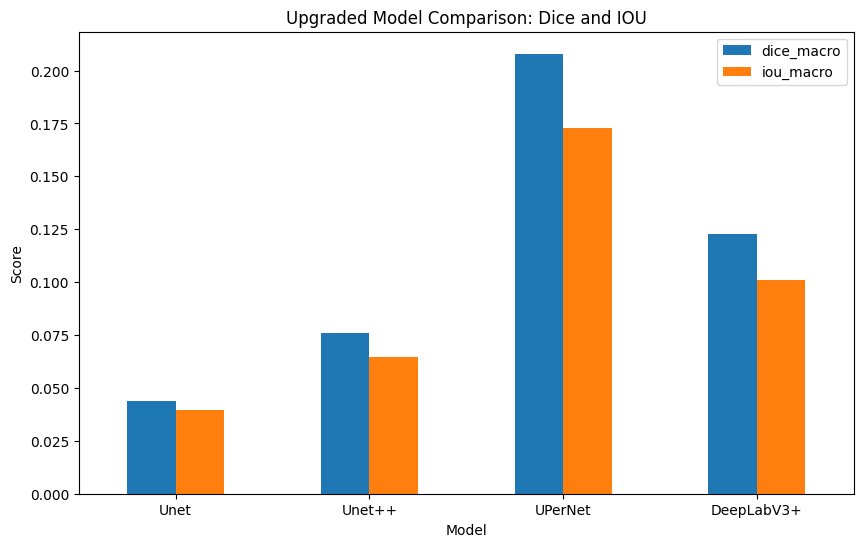

In [28]:
import torch
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import torchvision.transforms.v2 as T
from fastprogress import master_bar, progress_bar
from torch import nn
from skimage.io import imread
from sklearn.metrics import accuracy_score, jaccard_score, f1_score
import segmentation_models_pytorch as smp
import glob
import os
import time   
import random 


# --- 1. GLOBAL SETUP (Run Once) ---

def seed_everything(seed=42):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False 

# Fijamos la semilla
SEED = 42
seed_everything(SEED)
print(f"🔒 Semilla fijada en: {SEED}")
# ---------------------------------------------

# Color Mapping
color_to_class = np.zeros((256, 256, 256), dtype=np.int64)
color_to_class.fill(0) 
for index, row in classes.iterrows():
    r, g, b = int(row['r']), int(row['g']), int(row['b'])
    color_to_class[r, g, b] = index

# Transforms
ps = 224
n_classes = 59 
inf_transforms = T.Compose([
    T.ToImage(), 
    T.ToDtype(torch.float32, scale=True), 
    T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# Define the Names used in training
model_names = ["Unet", "Unet++", "UPerNet", "DeepLabV3+"]
final_results = []

# --- 2. LOOP THROUGH MODELS ---

for name in model_names:
    print(f"\n{'='*20}\nProcessing: {name}\n{'='*20}")
    
    # A. LOCATE LOGS AND CHECKPOINTS
    log_folder = f"ccp_{name}_imp"
    search_path = os.path.join(os.getcwd(), log_folder, "version_*")
    versions = sorted(glob.glob(search_path))
    
    if not versions:
        print(f"❌ No logs found for {name}. Skipping.")
        continue
        
    latest_version = versions[-1]
    metrics_csv_path = os.path.join(latest_version, "metrics.csv")
    ckpt_path = os.path.join(latest_version, "checkpoints", "best_valid_loss.ckpt")
    
    # B. PLOT TRAINING CURVES
    try:
        metric_df = pd.read_csv(metrics_csv_path)
        # Consolidate epoch rows
        metric_df = metric_df.groupby('epoch', as_index=False).first() 
        
        f, ax = plt.subplots(1, 1, figsize=(10, 5))
        metric_df.train_loss.plot(ax=ax, color='blue', label='train')
        metric_df.val_loss.plot(ax=ax, color='orange', label='val')
        ax.set_xlabel('Epoch')
        ax.set_ylabel('Loss (Focal)')
        ax.set_title(f'Convergence: {name} upgraded')
        ax.legend()
        plt.savefig(f"convergence_{name}_imp.png", dpi=200)
        plt.close() # Close plot to save memory
        print(f"✅ Saved convergence plot for {name}")
    except Exception as e:
        print(f"⚠️ Could not plot metrics for {name}: {e}")

    

    # C. RE-INSTANTIATE ARCHITECTURE
    if name == "Unet":
        arch = smp.Unet(encoder_name='resnet18', encoder_weights='imagenet', in_channels=3, classes=n_classes)
    elif name == "Unet++":
        arch = smp.UnetPlusPlus(encoder_name='resnet18', encoder_weights='imagenet', in_channels=3, classes=n_classes)
    elif name == "UPerNet":
        arch = smp.UPerNet(encoder_name='resnet18', encoder_weights='imagenet', in_channels=3, classes=n_classes)
    elif name == "DeepLabV3+":
        arch = smp.DeepLabV3Plus(encoder_name='resnet18', encoder_weights='imagenet', in_channels=3, classes=n_classes)

    # D. LOAD CHECKPOINT
    print(f"Loading weights from: {ckpt_path}")
    try:
        # CRITICAL: Pass 'model=arch' because we ignored it in save_hyperparameters
        best_model = CCP_SegmentationModel_Improved.load_from_checkpoint(
            checkpoint_path=ckpt_path,
            model=arch,
            n_classes=n_classes
        )
        best_model.eval()
        best_model.cuda()
    except Exception as e:
        print(f"❌ Failed to load {name}: {e}")
        continue

    # E. RUN INFERENCE LOOP
    print(f"Running Inference on Test Set for {name}...")
    metric_dict = []
    test_df = df.query('set == "test"')
    model_start_time = time.time()
    mb = master_bar(test_df.iterrows(), total=test_df.shape[0])
    
    for i, r in mb:
        
        # --- NUEVO: Inicio cronómetro por imagen ---
        start_time = time.time()
        
        # Read image and mask
        x = imread(r.image_path)
        y = imread(r.mask_path)
        
        # --- Safety Fixes ---
        if x.ndim == 2: x = np.stack([x]*3, axis=-1)
        elif x.ndim == 3 and x.shape[2] == 4: x = x[:, :, :3]
        if y.ndim == 3 and y.shape[2] == 4: y = y[:, :, :3]

        # Ground Truth indices
        y_true = color_to_class[y[:, :, 0], y[:, :, 1], y[:, :, 2]]
        
        # Sliding Window Config
        h, w = y_true.shape
        coords = DataModule.patch_origins(None, h, w, ps=ps, overlap=1).tolist()
        
        # Accumulators
        y_hat = torch.zeros((n_classes, h, w), dtype=torch.float32, device='cuda')
        y_wei = torch.zeros((1, h, w), dtype=torch.float32, device='cuda') 
        
        # Patch Loop
        for (coord_x, coord_y) in progress_bar(coords, parent=mb):
            xi = x[coord_x:coord_x+ps, coord_y:coord_y+ps]
            xi = inf_transforms(xi) # To Tensor + Normalize

            with torch.no_grad():
                logits = best_model(xi.unsqueeze(0).cuda())
                probs = nn.Softmax(dim=1)(logits)[0] 

            y_hat[:, coord_x:coord_x+ps, coord_y:coord_y+ps] += probs
            y_wei[:, coord_x:coord_x+ps, coord_y:coord_y+ps] += 1

        # Aggregate and Argmax
        y_hat /= y_wei
        y_hat_indices = y_hat.argmax(0).cpu().numpy()
        
        # --- NUEVO: Fin cronómetro ---
        end_time = time.time()
        inference_time_seconds = end_time - start_time

        # Metrics for this image
        metric_dict.append({
            'Model': name,
            'pixel_acc': accuracy_score(y_true.ravel(), y_hat_indices.ravel()),
            'iou_macro': jaccard_score(y_true.ravel(), y_hat_indices.ravel(), average='macro', zero_division=0),
            'iou_weighted': jaccard_score(y_true.ravel(), y_hat_indices.ravel(), average='weighted', zero_division=0),
            'dice_macro': f1_score(y_true.ravel(), y_hat_indices.ravel(), average='macro', zero_division=0),
            'dice_weighted': f1_score(y_true.ravel(), y_hat_indices.ravel(), average='weighted', zero_division=0),
            'time_per_img_sec': inference_time_seconds
        })
    model_end_time = time.time()
    total_duration = model_end_time - model_start_time
    
    
    # Average metrics for this model
    model_mean = pd.DataFrame(metric_dict).mean(numeric_only=True)
    model_mean['Model'] = name # Add name back
    final_results.append(model_mean)
    print(f"Results for {name}:\n{model_mean}")
    print(f"⏱️ Total Time inference: {total_duration:.2f}s")

# --- 3. FINAL COMPARISON ---
print("\n" + "="*30)
print("FINAL LEADERBOARD")
print("="*30)
leaderboard = pd.DataFrame(final_results).set_index('Model')
print(leaderboard)

# Guardar Leaderboard en CSV
leaderboard.to_csv("leaderboard_metrics_time.csv")
print("✅ Leaderboard guardado en 'leaderboard_metrics_time.csv'")

# Optional: Visual Comparison
leaderboard[['dice_macro', 'iou_macro']].plot(kind='bar', figsize=(10,6))
plt.title("Upgraded Model Comparison: Dice and IOU")
plt.ylabel("Score")
plt.xticks(rotation=0)
plt.savefig("comparison_upgraded_models_macro.png", dpi=250)
plt.show()

In [ ]:
model_start_time = time.time()

end_time = time.time()
inference_time_seconds = end_time - start_time

'time_per_img_sec': inference_time_seconds

## End Time execution impoved configuration models

## Best model
- Apply TTA
- Try removing vs not removing background like this 'self.loss_fn = smp.losses.FocalLoss(mode='multiclass', ignore_index=0)'. Ignoring index 0 means ignoring the background

In [9]:
class CCP_SegmentationModel_Improved(pl.LightningModule):
    def __init__(self, model, n_classes=59):
        super().__init__()
        self.save_hyperparameters(ignore=['model'])

        self.model = model

        # FIX 1: Assign FocalLoss correctly. 
        # Note: No 'from_logits=True' needed here, SMP handles it.
        # self.loss_fn = smp.losses.DiceLoss(mode='multiclass', from_logits=False)
        self.loss_fn = smp.losses.FocalLoss(mode='multiclass', normalized=False) # setting this to true made the loss almost 0

    def forward(self, x):
        return self.model(x)

    def configure_optimizers(self):
        # FIX 2: Lower Learning Rate to prevent collapse
        optimizer = torch.optim.Adam(self.parameters(), lr=1e-4)
        return {"optimizer": optimizer}

    def training_step(self, batch, batch_idx):
        x, y = batch
        logits = self(x)
        
        # Shape Check
        if y.ndim == 4: y = y.squeeze(1)
            
        loss = self.loss_fn(logits, y)
        
        self.log('train_loss', loss, on_step=False, on_epoch=True, prog_bar=True)
        return loss

    def validation_step(self, batch, batch_idx):
        x, y = batch
        logits = self(x)
        if y.ndim == 4: y = y.squeeze(1)

        loss = self.loss_fn(logits, y)
        self.log('val_loss', loss, on_step=False, on_epoch=True, prog_bar=True)
        return loss

In [ ]:
# !uv pip install ttach

In [31]:
import torch
import numpy as np
import pandas as pd
import torchvision.transforms.v2 as T
from fastprogress import master_bar, progress_bar
from torch import nn
from skimage.io import imread
from sklearn.metrics import accuracy_score, jaccard_score, f1_score
import segmentation_models_pytorch as smp
import glob
import os
import ttach as tta 
import time

# --- 1. GLOBAL SETUP ---

# Color Mapping
color_to_class = np.zeros((256, 256, 256), dtype=np.int64)
color_to_class.fill(0) 
for index, row in classes.iterrows():
    r, g, b = int(row['r']), int(row['g']), int(row['b'])
    color_to_class[r, g, b] = index

# Transforms
ps = 224
n_classes = 59 
inf_transforms = T.Compose([
    T.ToImage(), 
    T.ToDtype(torch.float32, scale=True), 
    T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# --- 2. SELECT THE BEST MODEL ---

# Option A: Automatic (if 'leaderboard' exists from previous cell)
# try:
#     best_name = leaderboard['iou_weighted'].idxmax()
#     print(f"🏆 Automatically selected best model: {best_name}")
# except:
    # Option B: Manual (If you restarted kernel)
best_name = "UPerNet" # Change this to your best performing model
print(f"⚙️ Manually selected model: {best_name}")

# --- 3. LOAD CHECKPOINT ---

log_folder = f"ccp_{best_name}_imp"
search_path = os.path.join(os.getcwd(), log_folder, "version_*")
versions = sorted(glob.glob(search_path))

if not versions:
    raise FileNotFoundError(f"No logs found for {best_name}")

latest_version = versions[-1]
ckpt_path = os.path.join(latest_version, "checkpoints", "best_valid_loss.ckpt")
print(f"Loading weights from: {ckpt_path}")

# Instantiate Architecture
if best_name == "Unet++":
    arch = smp.UnetPlusPlus(encoder_name='resnet18', encoder_weights='imagenet', in_channels=3, classes=n_classes)
elif best_name == "UPerNet":
    arch = smp.UPerNet(encoder_name='resnet18', encoder_weights='imagenet', in_channels=3, classes=n_classes)
elif best_name == "DeepLabV3+":
    arch = smp.DeepLabV3Plus(encoder_name='resnet18', encoder_weights='imagenet', in_channels=3, classes=n_classes)

# Load Weights
best_model = CCP_SegmentationModel.load_from_checkpoint(
    checkpoint_path=ckpt_path,
    model=arch,
    n_classes=n_classes
)
best_model.eval()
best_model.cuda()

# --- 4. APPLY TTA (TEST TIME AUGMENTATION) ---

print("✨ Wrapping model with TTA (Horizontal Flip)...")

# Define TTA transforms (Horizontal Flip is standard for street scenes/clothing)
tta_transforms = tta.Compose(
    [
        tta.HorizontalFlip(),
        # tta.Scale(scales=[0.9, 1, 1.1])# if you want multi-scale TTA (slower)
    ]
)
# tta_transforms = tta.aliases.d4_transform()

# Wrap the model
# merge_mode='mean' averages the logits from the original and flipped predictions
tta_model = tta.SegmentationTTAWrapper(best_model, tta_transforms, merge_mode='mean')


# --- 5. RUN INFERENCE (BATCHED) ---

print(f"Running Inference on Test Set for {best_name} with TTA (Batched)...")

metric_dict = []
test_df = df.query('set == "test"')
model_start_time = time.time()

mb = master_bar(test_df.iterrows(), total=test_df.shape[0])

# CONFIG
BATCH_SIZE = 32  # Process 32 patches at once (Adjust based on VRAM, 32/64 is usually safe)

for i, r in mb:
    start_time = time.time()

    # Read image and mask
    x = imread(r.image_path)
    y = imread(r.mask_path)
    
    # Safety Fixes
    if x.ndim == 2: x = np.stack([x]*3, axis=-1)
    elif x.ndim == 3 and x.shape[2] == 4: x = x[:, :, :3]
    if y.ndim == 3 and y.shape[2] == 4: y = y[:, :, :3]

    # Ground Truth
    y_true = color_to_class[y[:, :, 0], y[:, :, 1], y[:, :, 2]]
    
    # Sliding Window Config
    h, w = y_true.shape
    coords = DataModule.patch_origins(None, h, w, ps=ps, overlap=1).tolist()
    
    # Accumulators
    y_hat = torch.zeros((n_classes, h, w), dtype=torch.float32, device='cuda')
    y_wei = torch.zeros((1, h, w), dtype=torch.float32, device='cuda') 
    
    # --- BATCHED PATCH LOOP ---
    # We iterate through the coords in chunks of BATCH_SIZE
    for i in progress_bar(range(0, len(coords), BATCH_SIZE), parent=mb):
        batch_coords = coords[i : i + BATCH_SIZE]
        batch_patches = []
        
        # 1. Collect Batch on CPU
        for (cx, cy) in batch_coords:
            patch = x[cx:cx+ps, cy:cy+ps]
            # Apply transforms individually (CPU)
            tensor_patch = inf_transforms(patch) 
            batch_patches.append(tensor_patch)
            
        # 2. Stack into (Batch, 3, 224, 224) and move to GPU
        if not batch_patches: continue
        batch_tensor = torch.stack(batch_patches).cuda()
        
        # 3. Batch Inference (with TTA)
        with torch.no_grad():
            # TTA wrapper handles the batch dimension automatically
            logits = tta_model(batch_tensor)
            # print(f"Logits shape {logits.shape}")
            probs = nn.Softmax(dim=1)(logits) # (Batch, 59, 224, 224)
            
        # 4. Accumulate Results
        for idx, (cx, cy) in enumerate(batch_coords):
            # probs[idx] is the prediction for the patch at batch_coords[idx]
            y_hat[:, cx:cx+ps, cy:cy+ps] += probs[idx]
            y_wei[:, cx:cx+ps, cy:cy+ps] += 1

    # Aggregate
    y_hat /= y_wei
    y_hat_indices = y_hat.argmax(0).cpu().numpy()

    end_time = time.time()
    inference_time_seconds = end_time - start_time
    # Metrics
    metric_dict.append({
        'Model': f"{best_name} + TTA",
        'pixel_acc': accuracy_score(y_true.ravel(), y_hat_indices.ravel()),
        'iou_macro': jaccard_score(y_true.ravel(), y_hat_indices.ravel(), average='macro', zero_division=0),
        'iou_weighted': jaccard_score(y_true.ravel(), y_hat_indices.ravel(), average='weighted', zero_division=0),
        'dice_macro': f1_score(y_true.ravel(), y_hat_indices.ravel(), average='macro', zero_division=0),
        'dice_weighted': f1_score(y_true.ravel(), y_hat_indices.ravel(), average='weighted', zero_division=0),
        'time_per_img_sec': inference_time_seconds
    })

model_end_time = time.time()
total_duration = model_end_time - model_start_time
print(f"⏱️ Total Time inference: {total_duration:.2f}s")
metric_dict_df = pd.DataFrame(metric_dict)

metric_dict_df.to_csv(f"metrics_tta_{best_name}_horizontal.csv")

# --- 6. RESULTS ---
final_mean = pd.DataFrame(metric_dict).mean(numeric_only=True)
print(f"\nFinal Results for {best_name} with Batched TTA:\n{final_mean}")

⚙️ Manually selected model: UPerNet
Loading weights from: /home/alumno/Desktop/datos/Computer_vision/Assigment 4/ccp_UPerNet_imp/version_0/checkpoints/best_valid_loss.ckpt
✨ Wrapping model with TTA (Horizontal Flip)...
Running Inference on Test Set for UPerNet with TTA (Batched)...


⏱️ Total Time inference: 30.25s

Final Results for UPerNet with Batched TTA:
pixel_acc           0.836813
iou_macro           0.192772
iou_weighted        0.758021
dice_macro          0.235379
dice_weighted       0.810445
time_per_img_sec    0.078709
dtype: float64



FINAL LEADERBOARD
             pixel_acc  iou_macro  iou_weighted  dice_macro  dice_weighted
Model                                                                     
UPerNet_TTA   0.864058   0.196296      0.829015    0.235258       0.864114
UPerNet       0.861001   0.172887      0.826328    0.207967       0.861656


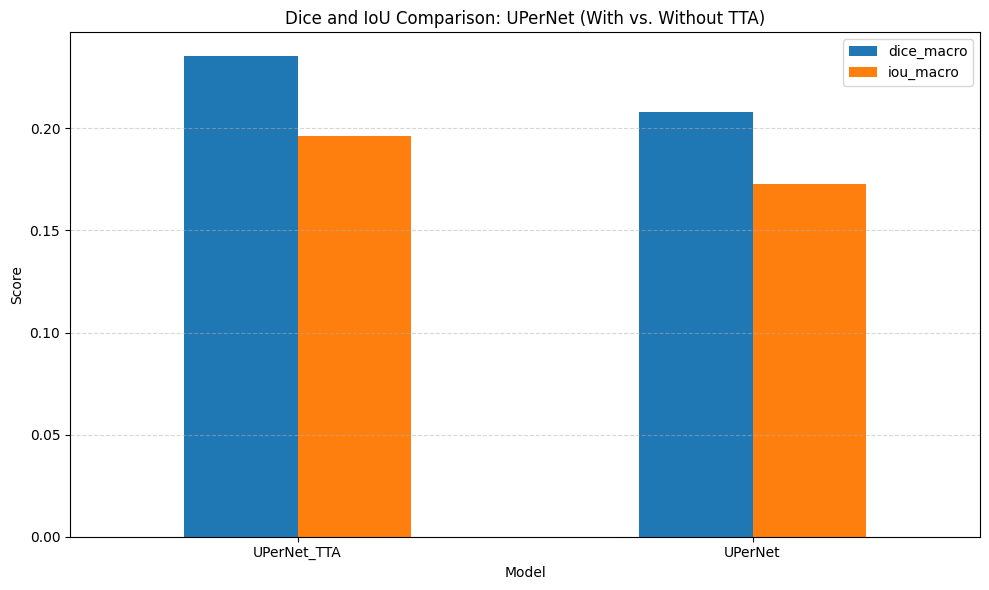

In [22]:
#Hacemos un plot de los resultados habiendo aplicado TTA y sin aplicarlos 
import pandas as pd
import matplotlib.pyplot as plt

# --- 1. PREPARAR DATOS EXTERNOS ---
name_best_model = 'UPerNet_TTA'

final_results = []
# A) Datos de UPerNet (Dato proporcionado)
upernet_results = {
    'Model': 'UPerNet',
    'pixel_acc': 0.861001,
    'iou_macro': 0.172887,
    'iou_weighted': 0.826328,
    'dice_macro': 0.207967,
    'dice_weighted': 0.861656
}

# B) Datos TTA (Desde final_mean)
# Convertimos la Serie 'final_mean' a diccionario para poder añadirla a la lista
results_uperNet_tta = final_mean.to_dict()
# Le asignamos el nombre al modelo base para diferenciarlo del que no usa TTA
results_uperNet_tta['Model'] = name_best_model

# --- 2. AGREGAR A LA LISTA DE MÉTRICAS ---
# Agregamos el modelo en el que se ha usado TTA
final_results.append(results_uperNet_tta)
#  Agregamos el modelo original
final_results.append(upernet_results)

# --- 3. FINAL COMPARISON (TABLA) ---
print("\n" + "="*30)
print("FINAL LEADERBOARD")
print("="*30)

# Creamos el DataFrame final
final_lederboard = pd.DataFrame(final_results).set_index('Model')

# Mostramos y guardamos
print(final_lederboard)
leaderboard.to_csv(f"leaderboard: {best_name} (With vs. Without TTA).csv")

# --- 4. VISUAL COMPARISON (GRÁFICO) ---

final_lederboard[['dice_macro', 'iou_macro']].plot(kind='bar', figsize=(10,6))
plt.title(f"Dice and IoU Comparison: {best_name} (With vs. Without TTA)")
plt.ylabel("Score")
plt.xticks(rotation=0) # Mantiene los nombres horizontales
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()

plt.savefig(f"Dice and IoU Comparison: {best_name} (With vs. Without TTA).png", dpi=250)
plt.show()


FINAL LEADERBOARD (3 MODELS)
                                pixel_acc  iou_macro  iou_weighted  \
Model                                                                
UPerNet (Reference)              0.861001   0.172887      0.826328   
UPerNet_TTA + TTA (d4)           0.836813   0.192772      0.758021   
UPerNet_TTA + TTA (Horizontal)   0.864058   0.196296      0.829015   

                                dice_macro  dice_weighted  
Model                                                      
UPerNet (Reference)               0.207967       0.861656  
UPerNet_TTA + TTA (d4)            0.235379       0.810445  
UPerNet_TTA + TTA (Horizontal)    0.235258       0.864114  


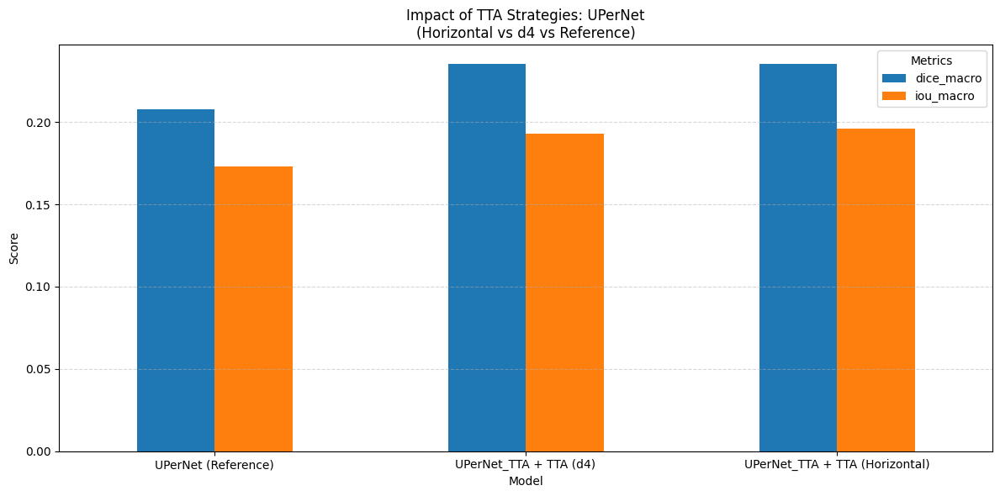

In [27]:
#  1. PREPARAR DATOS 

# A) Datos de UPerNet (Referencia Base)
upernet_results = {
    'Model': 'UPerNet (Reference)',
    'pixel_acc': 0.861001,
    'iou_macro': 0.172887,
    'iou_weighted': 0.826328,
    'dice_macro': 0.207967,
    'dice_weighted': 0.861656
}

# B) Datos TTA d4 (Los que acabas de calcular en final_mean)
results_d4 = final_mean.to_dict()
results_d4['Model'] = f"{name_best_model} + TTA (d4)"

# C) Datos TTA Horizontal (Recuperados del paso anterior)
results_horizontal = {
    'Model': f"{name_best_model} + TTA (Horizontal)", 
    'pixel_acc': 0.864058, 'iou_macro': 0.196296, 'dice_macro': 0.235258, 'iou_weighted': 0.829015 ,'dice_weighted': 0.864114 # Rellenar con tus datos reales si falla el CSV
}

# --- 2. CONSOLIDAR EL LEADERBOARD ---

final_results = []
final_results.append(upernet_results)      # 1. Referencia
final_results.append(results_d4)           # 2. Modelo TTA (d4)
final_results.append(results_horizontal)   # 3. Modelo TTA (Horizontal)

# Creamos el DataFrame
leaderboard = pd.DataFrame(final_results).set_index('Model')

# Filtramos solo las columnas numéricas para evitar errores si se coló alguna columna extra del CSV
cols_to_keep = ['pixel_acc', 'iou_macro', 'iou_weighted', 'dice_macro', 'dice_weighted']
leaderboard = leaderboard[cols_to_keep]

# --- 3. MOSTRAR RESULTADOS ---
print("\n" + "="*30)
print("FINAL LEADERBOARD (3 MODELS)")
print("="*30)
print(leaderboard)

# Guardamos el comparativo completo
leaderboard.to_csv(f"leaderboard_comparison_all_strategies.csv")

# --- 4. VISUAL COMPARISON (GRÁFICO) ---

# Colores personalizados para diferenciar mejor (opcional)
colors = ['#1f77b4', '#ff7f0e'] # Azul (Dice_macro), Naranja (Iou_macro)

ax = leaderboard[['dice_macro', 'iou_macro']].plot(kind='bar', figsize=(12, 6), color=colors[:len(leaderboard)])

plt.title(f"Impact of TTA Strategies: {best_name}\n(Horizontal vs d4 vs Reference)")
plt.ylabel("Score")
plt.xticks(rotation=0) 
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.legend(title="Metrics")
plt.tight_layout()

plt.savefig(f"comparison_tta_strategies_{best_name}.png", dpi=250)
plt.show()

## Matriz de confusión mejor modelo (UperNet + Horizontal FLip)

✅ Cargadas 59 clases desde class_dict.csv
📂 Cargando pesos desde: /home/alumno/Desktop/datos/Computer_vision/Assigment 4/ccp_UPerNet_imp/version_0/checkpoints/best_valid_loss.ckpt
✨ Aplicando TTA (Horizontal Flip)...
🚀 Ejecutando Inferencia (UPerNet)...



🎨 Generando Visualización Best vs Worst Case...


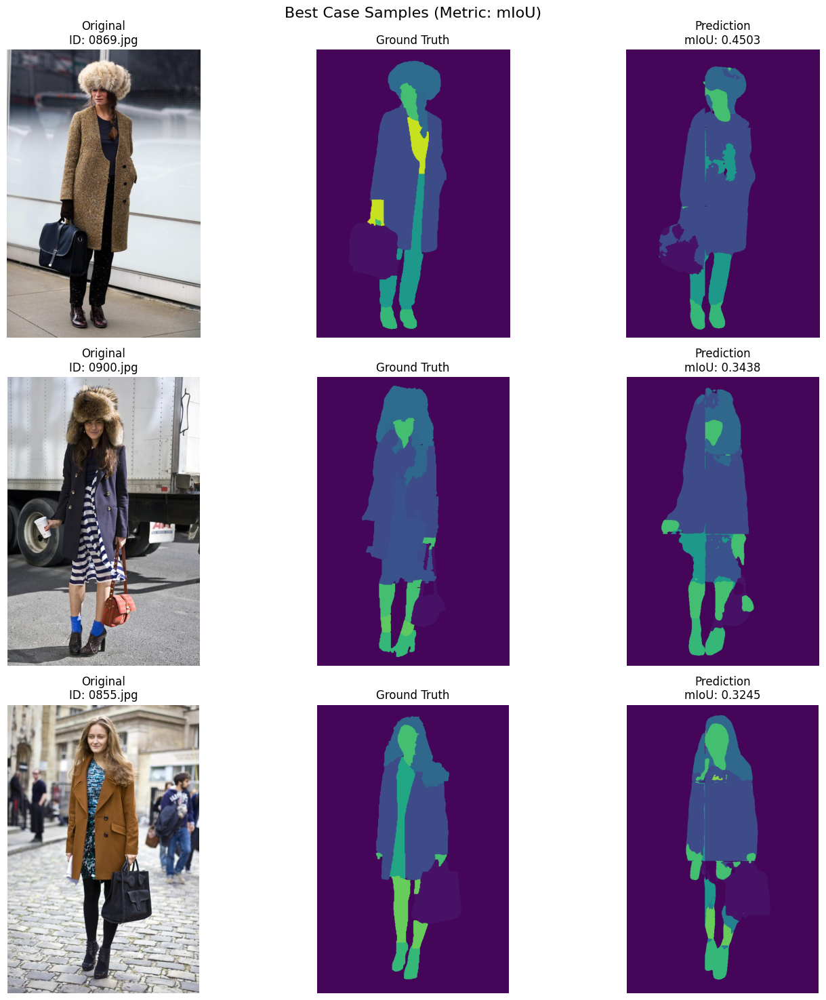

✅ Guardado: best_case_samples.png


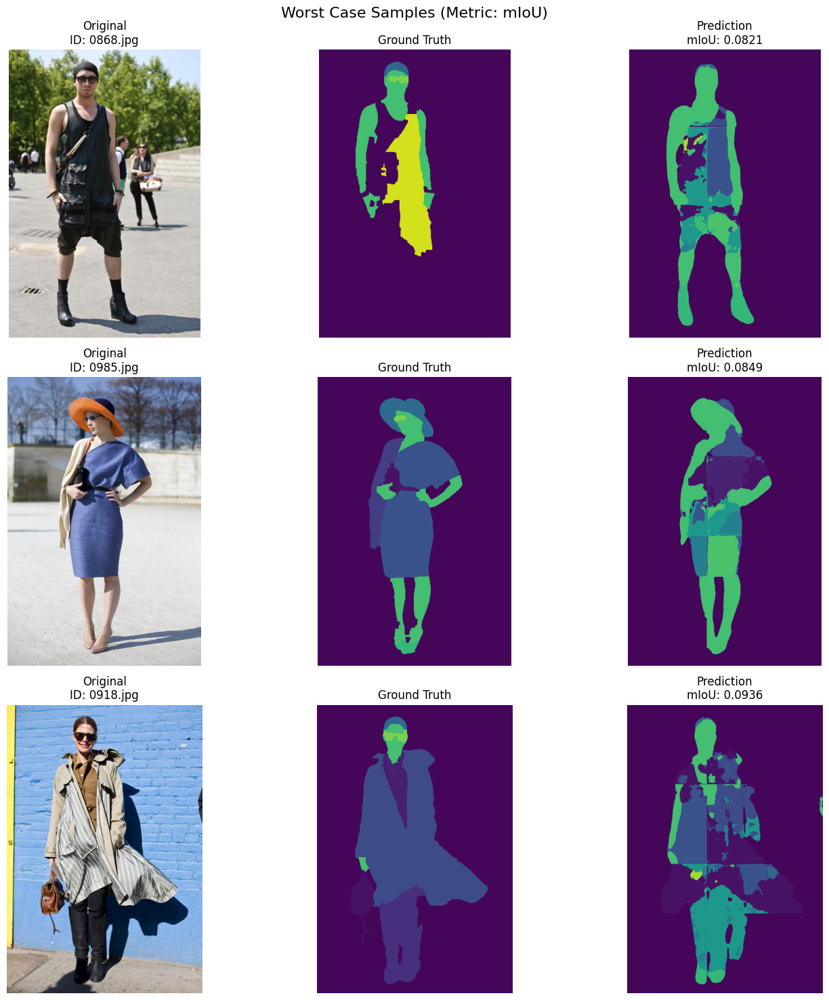

✅ Guardado: worst_case_samples.png

🔍 Analizando las mayores confusiones...

🔝 TOP-10 PARES DE CLASES MÁS CONFUNDIDAS
⚠️  Real: ring            --> Predicho: dress           | Tasa de Error: 75.60%
⚠️  Real: sneakers        --> Predicho: shoes           | Tasa de Error: 68.86%
⚠️  Real: watch           --> Predicho: skin            | Tasa de Error: 67.36%
⚠️  Real: loafers         --> Predicho: unlabeled       | Tasa de Error: 64.80%
⚠️  Real: flats           --> Predicho: shoes           | Tasa de Error: 59.45%
⚠️  Real: sunglasses      --> Predicho: skin            | Tasa de Error: 57.67%
⚠️  Real: shorts          --> Predicho: pants           | Tasa de Error: 56.28%
⚠️  Real: bracelet        --> Predicho: skin            | Tasa de Error: 53.79%
⚠️  Real: sandals         --> Predicho: shoes           | Tasa de Error: 52.54%
⚠️  Real: bodysuit        --> Predicho: pants           | Tasa de Error: 50.74%

🎨 Generando Gráfico...


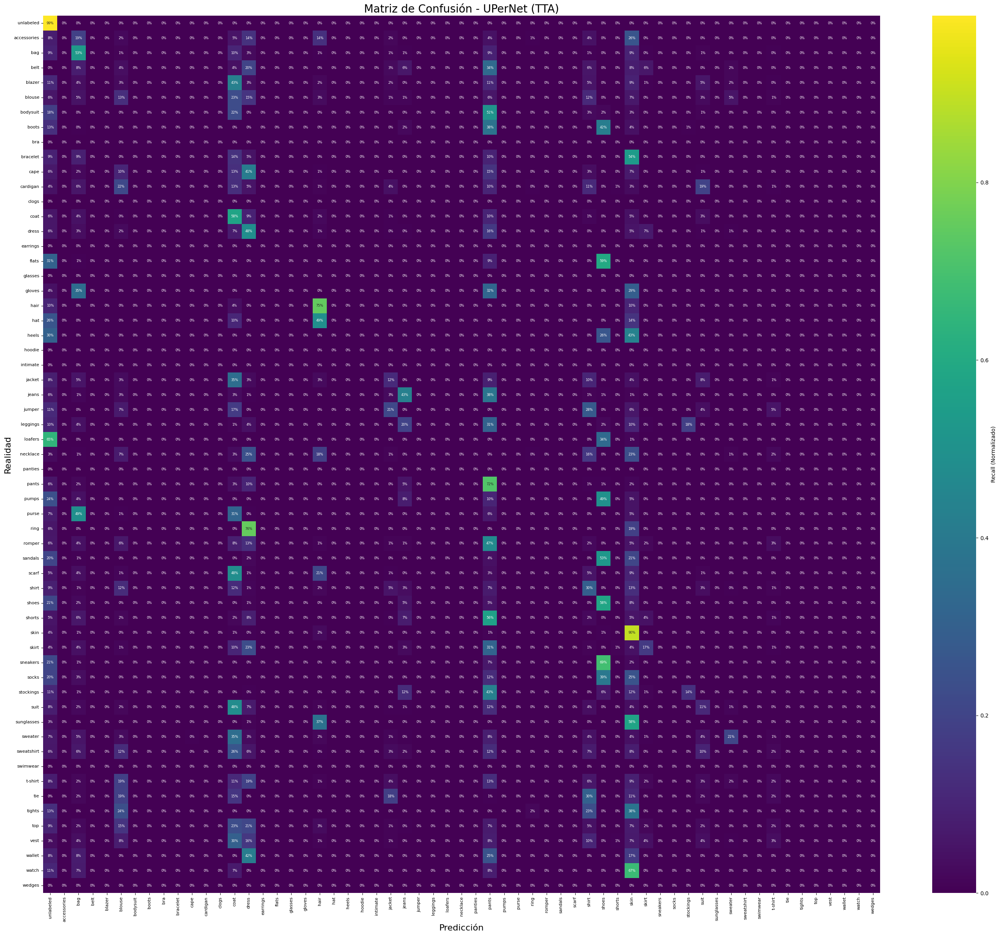

✅ Matriz guardada en 'confusion_matrix_UPerNet_names_numbers.png'


In [39]:
import torch
import numpy as np
import pandas as pd
import torchvision.transforms.v2 as T
from fastprogress import master_bar, progress_bar
from torch import nn
from skimage.io import imread
from sklearn.metrics import confusion_matrix, jaccard_score # <--- Necesitamos jaccard_score
import segmentation_models_pytorch as smp
import glob
import os
import ttach as tta 
import time
import matplotlib.pyplot as plt
import seaborn as sns

# --- 1. CONFIGURACIÓN Y CARGA DE CLASES ---

try:
    classes = pd.read_csv('./clothes/class_dict.csv')
    classes['class_name'] = classes['class_name'].fillna('unlabeled')
    class_names = classes['class_name'].tolist()
    # Crear paleta de colores para visualización (Index -> RGB)
    PALETTE = classes[['r', 'g', 'b']].values.astype(np.uint8)
    print(f"✅ Cargadas {len(classes)} clases desde class_dict.csv")
except FileNotFoundError:
    print("❌ Error: No se encuentra 'class_dict.csv'.")
    classes = pd.DataFrame({'r':[], 'g':[], 'b':[]})
    class_names = [str(i) for i in range(59)]
    PALETTE = np.random.randint(0, 255, (59, 3), dtype=np.uint8)

# Fijar modelo
model_name = "UPerNet" 

# Mapeo de Colores (RGB -> Index)
color_to_class = np.zeros((256, 256, 256), dtype=np.int64)
color_to_class.fill(0) 

if not classes.empty:
    for index, row in classes.iterrows():
        r, g, b = int(row['r']), int(row['g']), int(row['b'])
        color_to_class[r, g, b] = index

# Transformaciones
ps = 224
n_classes = len(class_names)
inf_transforms = T.Compose([
    T.ToImage(), 
    T.ToDtype(torch.float32, scale=True), 
    T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# --- 2. CARGAR MODELO ---

log_folder = f"ccp_{model_name}_imp"
search_path = os.path.join(os.getcwd(), log_folder, "version_*")
versions = sorted(glob.glob(search_path))

if not versions:
    raise FileNotFoundError(f"No logs found for {model_name}")

latest_version = versions[-1]
ckpt_path = os.path.join(latest_version, "checkpoints", "best_valid_loss.ckpt")
print(f"📂 Cargando pesos desde: {ckpt_path}")

arch = smp.UPerNet(encoder_name='resnet18', encoder_weights='imagenet', in_channels=3, classes=n_classes)
best_model = CCP_SegmentationModel_Improved.load_from_checkpoint(
    checkpoint_path=ckpt_path, model=arch, n_classes=n_classes
)
best_model.eval()
best_model.cuda()

# --- 3. TTA ---
print("✨ Aplicando TTA (Horizontal Flip)...")
tta_transforms = tta.Compose([tta.HorizontalFlip()])
tta_model = tta.SegmentationTTAWrapper(best_model, tta_transforms, merge_mode='mean')

# --- 4. INFERENCIA GLOBAL Y SELECCIÓN DE MUESTRAS ---

print(f"🚀 Ejecutando Inferencia ({model_name})...")
test_df = df.query('set == "test"')
global_cm = np.zeros((n_classes, n_classes), dtype=np.int64)

# Lista para guardar puntuaciones por imagen
sample_scores = [] 

mb = master_bar(test_df.iterrows(), total=test_df.shape[0])
BATCH_SIZE = 32 

for i, r in mb:
    x = imread(r.image_path)
    y = imread(r.mask_path)
    
    if x.ndim == 2: x = np.stack([x]*3, axis=-1)
    elif x.ndim == 3 and x.shape[2] == 4: x = x[:, :, :3]
    if y.ndim == 3 and y.shape[2] == 4: y = y[:, :, :3]

    y_true = color_to_class[y[:, :, 0], y[:, :, 1], y[:, :, 2]]
    h, w = y_true.shape
    coords = DataModule.patch_origins(None, h, w, ps=ps, overlap=1).tolist()
    
    y_hat = torch.zeros((n_classes, h, w), dtype=torch.float32, device='cuda')
    y_wei = torch.zeros((1, h, w), dtype=torch.float32, device='cuda') 
    
    for i in progress_bar(range(0, len(coords), BATCH_SIZE), parent=mb):
        batch_coords = coords[i : i + BATCH_SIZE]
        batch_patches = [inf_transforms(x[cx:cx+ps, cy:cy+ps]) for (cx, cy) in batch_coords]
        
        if not batch_patches: continue
        batch_tensor = torch.stack(batch_patches).cuda()
        
        with torch.no_grad():
            logits = tta_model(batch_tensor)
            probs = nn.Softmax(dim=1)(logits)
            
        for idx, (cx, cy) in enumerate(batch_coords):
            y_hat[:, cx:cx+ps, cy:cy+ps] += probs[idx]
            y_wei[:, cx:cx+ps, cy:cy+ps] += 1

    y_hat /= y_wei
    y_hat_indices = y_hat.argmax(0).cpu().numpy()
    
    # Acumular matriz global
    current_cm = confusion_matrix(y_true.ravel(), y_hat_indices.ravel(), labels=range(n_classes))
    global_cm += current_cm

    # --- NUEVO: Calcular mIoU para ESTA imagen y guardar referencia ---
    score = jaccard_score(y_true.ravel(), y_hat_indices.ravel(), average='macro', zero_division=0)
    sample_scores.append({
        'image_path': r.image_path,
        'mask_path': r.mask_path,
        'score': score
    })
    # ------------------------------------------------------------------

# --- 5. VISUALIZACIÓN BEST vs WORST ---

print("\n🎨 Generando Visualización Best vs Worst Case...")

# Convertir a DataFrame y ordenar
scores_df = pd.DataFrame(sample_scores)
best_samples = scores_df.nlargest(3, 'score')  # Top 3 mejores
worst_samples = scores_df.nsmallest(3, 'score') # Top 3 peores

def visualize_samples(sample_rows, title_prefix):
    """
    Función auxiliar para re-procesar y pintar imágenes seleccionadas.
    """
    fig, axes = plt.subplots(len(sample_rows), 3, figsize=(15, 5 * len(sample_rows)))
    if len(sample_rows) == 1: axes = [axes] # Manejar caso de 1 sola fila
    
    plt.suptitle(f"{title_prefix} Samples (Metric: mIoU)", fontsize=16)
    
    for idx, (index, row) in enumerate(sample_rows.iterrows()):
        # 1. Cargar y Preprocesar (Repetimos lógica para no guardar Tensores en RAM)
        x = imread(row['image_path'])
        y = imread(row['mask_path'])
        
        if x.ndim == 2: x = np.stack([x]*3, axis=-1)
        elif x.ndim == 3 and x.shape[2] == 4: x = x[:, :, :3]
        if y.ndim == 3 and y.shape[2] == 4: y = y[:, :, :3]

        y_true = color_to_class[y[:, :, 0], y[:, :, 1], y[:, :, 2]]
        h, w = y_true.shape
        coords = DataModule.patch_origins(None, h, w, ps=ps, overlap=1).tolist()
        
        y_hat = torch.zeros((n_classes, h, w), dtype=torch.float32, device='cuda')
        y_wei = torch.zeros((1, h, w), dtype=torch.float32, device='cuda') 
        
        # Inferencia rápida (BATCH=64 para ir rápido en pocas imgs)
        batch_size_vis = 64
        for i in range(0, len(coords), batch_size_vis):
            batch_coords = coords[i : i + batch_size_vis]
            batch_patches = [inf_transforms(x[cx:cx+ps, cy:cy+ps]) for (cx, cy) in batch_coords]
            if not batch_patches: continue
            batch_tensor = torch.stack(batch_patches).cuda()
            with torch.no_grad():
                logits = tta_model(batch_tensor)
                probs = nn.Softmax(dim=1)(logits)
            for b_idx, (cx, cy) in enumerate(batch_coords):
                y_hat[:, cx:cx+ps, cy:cy+ps] += probs[b_idx]
                y_wei[:, cx:cx+ps, cy:cy+ps] += 1
                
        y_hat /= y_wei
        y_hat_indices = y_hat.argmax(0).cpu().numpy()
        
        # 2. Convertir índices a RGB usando la paleta
        pred_rgb = PALETTE[y_hat_indices]
        
        # 3. Plotear
        ax = axes[idx]
        
        # Imagen Original
        ax[0].imshow(x)
        ax[0].set_title(f"Original\nID: {os.path.basename(row['image_path'])}")
        ax[0].axis('off')
        
        # Ground Truth
        ax[1].imshow(y)
        ax[1].set_title("Ground Truth")
        ax[1].axis('off')
        
        # Predicción
        ax[2].imshow(pred_rgb)
        ax[2].set_title(f"Prediction\nmIoU: {row['score']:.4f}")
        ax[2].axis('off')
        
    plt.tight_layout()
    filename = f"{title_prefix.lower().replace(' ', '_')}_samples.png"
    plt.savefig(filename, dpi=150)
    plt.show()
    print(f"✅ Guardado: {filename}")

# Ejecutar visualización
visualize_samples(best_samples, "Best Case")
visualize_samples(worst_samples, "Worst Case")

# --- 5. ANÁLISIS TOP-10 CONFUSIONES ---

print("\n🔍 Analizando las mayores confusiones...")

# Normalizar matriz (Recall por fila)
row_sums = global_cm.sum(axis=1, keepdims=True).astype(float)
row_sums[row_sums == 0] = 1.0 
norm_cm = global_cm / row_sums

# Crear DataFrame para manipulación fácil
cm_df = pd.DataFrame(norm_cm, index=class_names, columns=class_names)

# Deshacer la matriz a una lista de pares (Real, Predicho, Valor)
confusions = cm_df.stack().reset_index()
confusions.columns = ['Actual', 'Predicted', 'Recall']

# Eliminar la diagonal (aciertos) y ordenar
errors = confusions[confusions['Actual'] != confusions['Predicted']]
top_10_errors = errors.sort_values(by='Recall', ascending=False).head(10)

print("\n" + "="*50)
print("🔝 TOP-10 PARES DE CLASES MÁS CONFUNDIDAS")
print("="*50)
for idx, row in top_10_errors.iterrows():
    print(f"⚠️  Real: {row['Actual']:<15} --> Predicho: {row['Predicted']:<15} | Tasa de Error: {row['Recall']:.2%}")
print("="*50 + "\n")

# Guardar en CSV para análisis detallado
top_10_errors.to_csv("top_10_confusions.csv", index=False)

# --- 6. VISUALIZACIÓN ---

print("🎨 Generando Gráfico...")
plt.figure(figsize=(28, 24)) # Tamaño gigante para que quepan 59 clases

sns.heatmap(
    norm_cm, 
    annot=True,           # <--- AHORA SÍ PONE NÚMEROS
    fmt='.0%',            # Formato porcentaje sin decimales para ahorrar espacio (ej. 12%)
    # Si prefieres decimales cambia a '.2f' pero ocupará más
    annot_kws={"size": 6}, # Tamaño de letra pequeño para que quepa
    cmap='viridis',       
    xticklabels=class_names,
    yticklabels=class_names,
    cbar_kws={'label': 'Recall (Normalizado)'}
)

plt.title(f'Matriz de Confusión - {model_name} (TTA)', fontsize=20)
plt.xlabel('Predicción', fontsize=16)
plt.ylabel('Realidad', fontsize=16)
plt.xticks(rotation=90, fontsize=8) 
plt.yticks(rotation=0, fontsize=8)

plt.tight_layout()
plt.savefig(f"confusion_matrix_{model_name}_names_numbers.png", dpi=300)
plt.show()

print(f"✅ Matriz guardada en 'confusion_matrix_{model_name}_names_numbers.png'")